In [1]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pathlib
import sys
import matplotlib
import matplotlib.cm as cm

from utils import *
import dPCA
import affinewarp

%reload_ext autoreload
%autoreload 2

plt.style.use("basic.mplstyle")
%matplotlib inline

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



## assemble data

In [2]:
print("platform: ", sys.platform)
if sys.platform == "linux":
    data_path = pathlib.Path('/mnt/c/Users/spencer/data/APT')
else:
    data_path = pathlib.Path('/Users/spencerw/Google Drive/APT_data')
    
# get files 
matfiles = list(data_path.glob('*.mat'))
print("num files: ", len(matfiles))

subject_numbers = ["S301","S302","S303","S304","S305","S306","S307","S308","S309","S310","S311","S322","S323","S327","S328"]
control_subject_numbers = ['S312','S313','S314','S315','S316','S317','S318','S319','S320','S325','S326']

# make a list of Session objects for each subject
subject_sessions = []
for subject in subject_numbers[2:3]:
    sessions = build_subject_sessions(subject, matfiles)
    print("subject ", subject,": ", len(sessions), " sessions")
    subject_sessions.append(sessions)
    

platform:  darwin
num files:  974
subject  S303 :  11  sessions


## Globals

In [3]:
SUBJECT = 0
SESSION = 1
TARGET = 2
RADIUS = 256
WIDTH = 100

In [4]:
# we have sessions each with a polar trajectory list
sessions = subject_sessions[SUBJECT][1:-1]
session_lists = [session.combine_trials(TARGET) for session in sessions]
print("Number of sessions: \n",len(session_lists))
print("Trials in sessions: \n",[len(sl) for sl in session_lists])
block_lists = [b.trials for b in combine_blocks_from_sessions(sessions,TARGET)]
print("Number of blocks: \n",len(block_lists))
print("Trials in blocks: \n",[len(bl) for bl in block_lists])

Number of sessions: 
 9
Trials in sessions: 
 [45, 45, 45, 45, 45, 45, 45, 45, 45]
Number of blocks: 
 27
Trials in blocks: 
 [15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15]


trials in session 1: 45
training trials from subject for target 1: 405
training trials from subject for target 2: 405
number of outlier training trials removed: 0


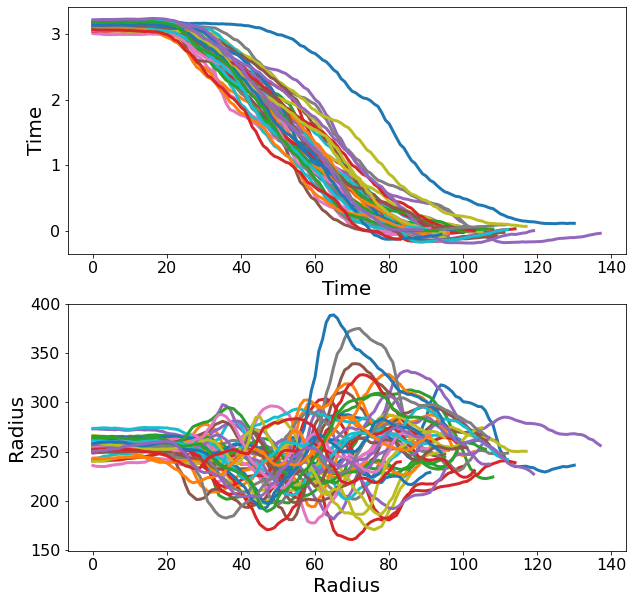

In [5]:
session = subject_sessions[SUBJECT][SESSION]
trials = session.combine_trials(TARGET)
plot_trajectories([t.polar_trajectory for t in trials])
all_trials = combine_trials_from_sessions(sessions,TARGET)

print(f"trials in session {SESSION}: {len(session.combine_trials(TARGET))}")
print(f"training trials from subject for target {1}: {len(combine_trials_from_sessions(subject_sessions[SUBJECT][1:-1],1))}")
print(f"training trials from subject for target {2}: {len(combine_trials_from_sessions(subject_sessions[SUBJECT][1:-1],2))}")
print(f"number of outlier training trials removed: {np.sum([len(s.outlier_trials) for s in subject_sessions[SUBJECT][1:-1]])}")

# interpolate+warp each trial

Using the median length trajectory from the training trials, interpolate and time warp all other trajectories to match that reference. This, we hope, will align trajectories in the angular dimension for more interpretable procesing downstream. 

In [6]:
# for a set of trials, find the template trajectory
combined_trials = combine_trials_from_sessions(sessions,TARGET)
median_trial = find_median_length_trial(combined_trials)
median_trial.polar_trajectory.shape
reference = median_trial.interpolated_polar_trajectory[0]
for trial in combined_trials:
    trial.apply_time_warping(reference)

Text(0.5, 1.0, 'Warped Radii')

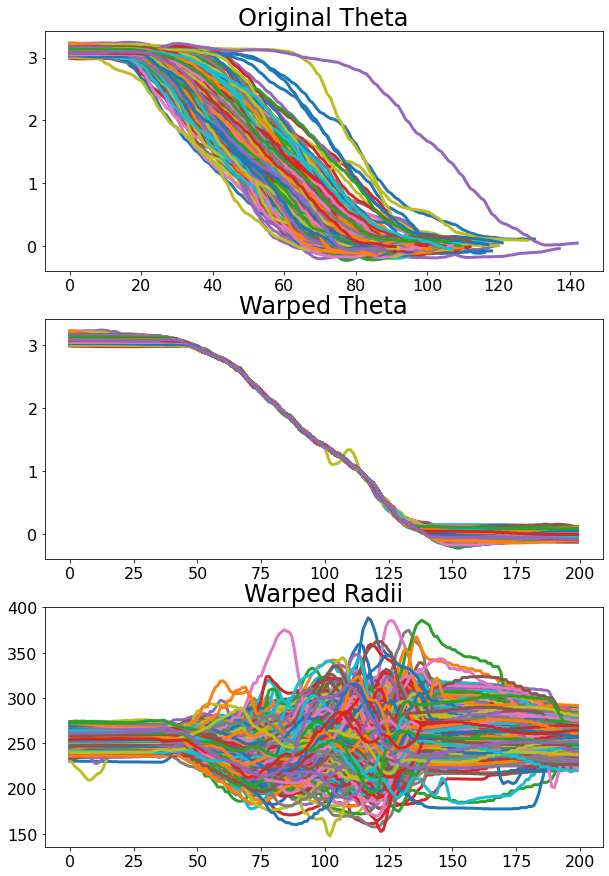

In [7]:
fig, axes = plt.subplots(3,1,figsize=(10,15))
tpax=axes[0]
tax=axes[1]
rax=axes[2]
for trial in combined_trials:
    tpax.plot(trial.polar_trajectory[0])
    tax.plot(trial.warped_polar_trajectory[0])
    rax.plot(trial.warped_polar_trajectory[1])
tpax.set_title("Original Theta")
tax.set_title("Warped Theta")
rax.set_title("Warped Radii")

# make stacks

In [8]:
curve_stack = stack_curves(sessions,TARGET,type="interpolated")
derivative_stack = stack_derivatives(sessions,TARGET)
reward_stack = stack_reward(sessions,TARGET)
print("trajectory and derivative stacks: ", len(all_trials),curve_stack.shape,derivative_stack.shape,reward_stack.shape)

trajectory and derivative stacks:  405 (405, 2, 200) (405, 2, 200) (405, 1)


# affine warping

In [9]:
model = affinewarp.PiecewiseWarping(n_knots=2, warp_reg_scale=1e-6, smoothness_reg_scale=20.0)
model.fit(curve_stack[:,0,:])

Loss improvement: 95.91%: 100%|██████████| 50/50 [00:38<00:00,  1.28it/s]


In [21]:
affine_warped_stack = np.stack([model.transform(curve_stack[:,0,:]), 
                                model.transform(curve_stack[:,1,:])],axis=1)[:,:,:,0]
affine_warped_derivative_stack = np.stack([model.transform(derivative_stack[:,0,:]), 
                                model.transform(derivative_stack[:,1,:])],axis=1)[:,:,:,0]

print(affine_warped_stack.shape, curve_stack.shape, derivative_stack.shape)
for i, trial in enumerate(combined_trials):
    trial.warped_polar_trajectory = affine_warped_stack[i]
curve_stack = stack_curves(sessions,TARGET)

(405, 2, 200) (405, 2, 200) (405, 2, 200)


Text(0.5, 1.0, 'Warped Radii')

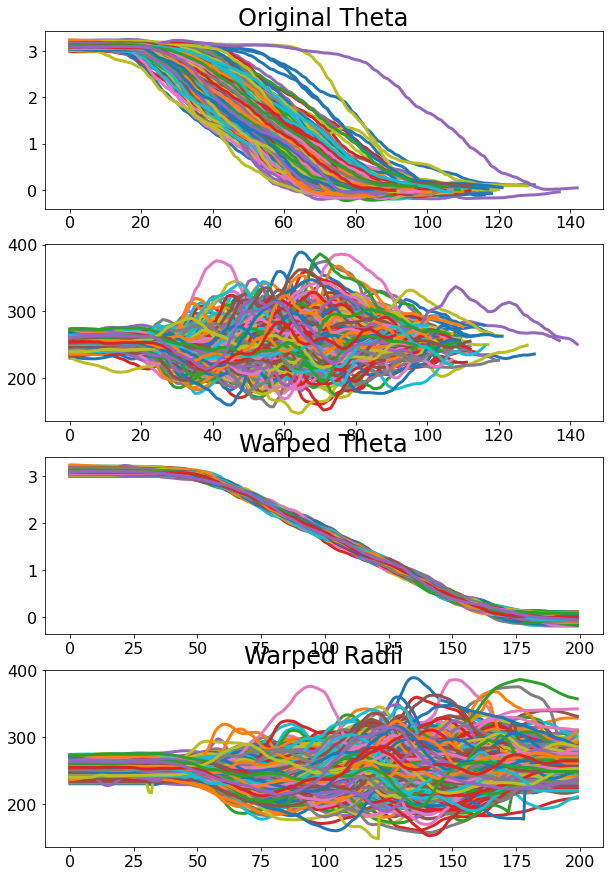

In [11]:
fig, axes = plt.subplots(4,1,figsize=(10,15))
tpax=axes[0]
rpax=axes[1]
tax=axes[2]
rax=axes[3]
for trial in combined_trials:
    tpax.plot(trial.polar_trajectory[0])
    rpax.plot(trial.polar_trajectory[1])
    tax.plot(trial.warped_polar_trajectory[0])
    rax.plot(trial.warped_polar_trajectory[1])
tpax.set_title("Original Theta")
tax.set_title("Warped Theta")
rax.set_title("Warped Radii")

## derviatives -- when to take them?

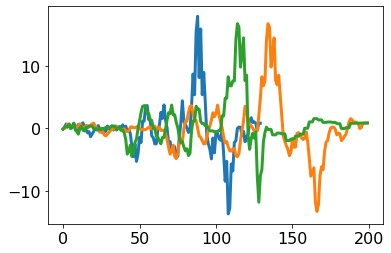

In [33]:
# plt.plot(np.diff(affine_warped_stack[0,0]))

# plt.plot(affine_warped_derivative_stack[0,0])
plt.plot(all_trials[0].polar_derivative[1])
# plt.plot(np.diff(curve_stack[0,1],1))
plt.plot(derivative_stack[0,1])
plt.plot(all_trials[0].warped_polar_derivative[1])

## outliers

(0.0, 500.0)

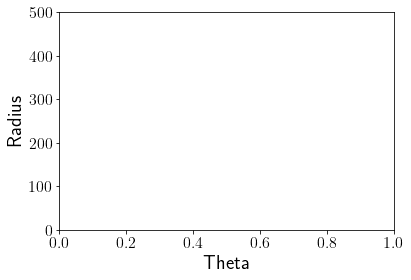

In [435]:
for session in subject_sessions[SUBJECT]:
    for trial in session.outlier_trials:
        plot_single_trajectory(trial.polar_trajectory)
plt.xlabel("Theta")
plt.ylabel("Radius")
plt.ylim([0,500])

## plot data

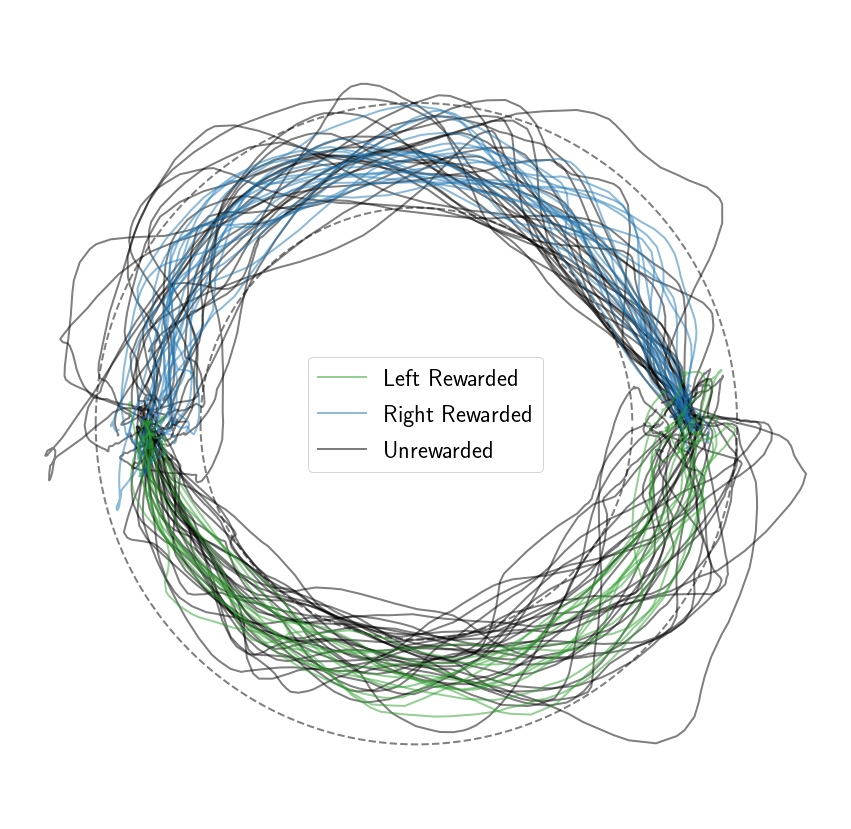

In [438]:
plt.figure(figsize=(15,15))
lw=2
ak=0.5
right_session_trials = subject_sessions[SUBJECT][SESSION].combine_trials(target=1)
left_session_trials = subject_sessions[SUBJECT][SESSION].combine_trials(target=2)
for trial in right_session_trials:
    if trial.reward:
        r, = plt.plot(trial.trajectory[0], trial.trajectory[1],'tab:blue',zorder=100,linewidth=lw,alpha=ak)
    else:
        u, = plt.plot(trial.trajectory[0], trial.trajectory[1],'k',linewidth=lw,alpha=ak)

for trial in left_session_trials:
    if trial.reward:
        l, = plt.plot(trial.trajectory[0], trial.trajectory[1],'tab:green',zorder=100,linewidth=lw,alpha=ak)
    else:
        u, = plt.plot(trial.trajectory[0], trial.trajectory[1],'k',linewidth=lw,alpha=ak)
        
plt.plot(generate_arc(200,radius=RADIUS+WIDTH//2).T[0],generate_arc(200,radius=RADIUS+WIDTH//2).T[1],'--k',linewidth=lw,alpha=ak)
plt.plot(generate_arc(200,radius=RADIUS-WIDTH//2).T[0],generate_arc(200,radius=RADIUS-WIDTH//2).T[1],'--k',linewidth=lw,alpha=ak)
plt.plot(generate_arc(200,radius=RADIUS+WIDTH//2).T[0],-generate_arc(200,radius=RADIUS+WIDTH//2).T[1],'--k',linewidth=lw,alpha=ak)
plt.plot(generate_arc(200,radius=RADIUS-WIDTH//2).T[0],-generate_arc(200,radius=RADIUS-WIDTH//2).T[1],'--k',linewidth=lw,alpha=ak)
plt.gca().axis('equal')
plt.gca().axis('off')
# plt.title(" ".join(subject_sessions[SUBJECT][SESSION].name.split(".")[:-1]))
plt.legend([l,r,u],["Left Rewarded", "Right Rewarded", "Unrewarded"],fontsize=24)

## aligned trajectories

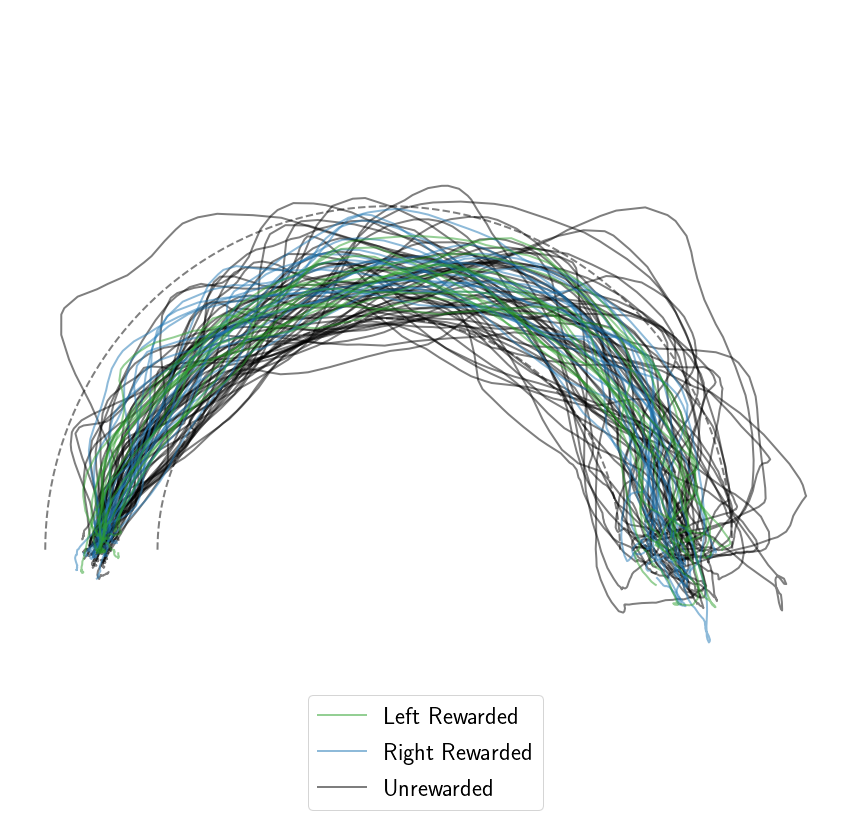

In [439]:
plt.figure(figsize=(15,15))
lw=2
ak=0.5
for trial in right_session_trials:
    if trial.reward:
        r, = plt.plot(trial.aligned_trajectory[0], trial.aligned_trajectory[1],'tab:blue',zorder=100,linewidth=lw,alpha=ak)
    else:
        u, = plt.plot(trial.aligned_trajectory[0], trial.aligned_trajectory[1],'k',linewidth=lw,alpha=ak)

for trial in left_session_trials:
    if trial.reward:
        l, = plt.plot(trial.aligned_trajectory[0], trial.aligned_trajectory[1],'tab:green',zorder=100,linewidth=lw,alpha=ak)
    else:
        u, = plt.plot(trial.aligned_trajectory[0], trial.aligned_trajectory[1],'k',linewidth=lw,alpha=ak)
        
plt.plot(generate_arc(200,radius=306).T[0],generate_arc(200,radius=306).T[1],'--k',linewidth=lw,alpha=ak)
plt.plot(generate_arc(200,radius=206).T[0],generate_arc(200,radius=206).T[1],'--k',linewidth=lw,alpha=ak)
plt.gca().axis('equal')
plt.gca().axis('off')
# plt.title(" ".join(subject_sessions[SUBJECT][SESSION].name.split(".")[:-1]))
plt.legend([l,r,u],["Left Rewarded", "Right Rewarded", "Unrewarded"],loc="lower center", fontsize=24)

## polar plot

<ipython-input-440-db03576bc3a8>:11: MatplotlibDeprecationWarning: The parameter where must have the same size as x in fill_between(). This will become an error in future versions of Matplotlib.
  polar_ax.fill_between(mean[0], mean[1]+std[1], mean[1]-std[1], 'b', alpha=.4, zorder=100,label="Stddev")


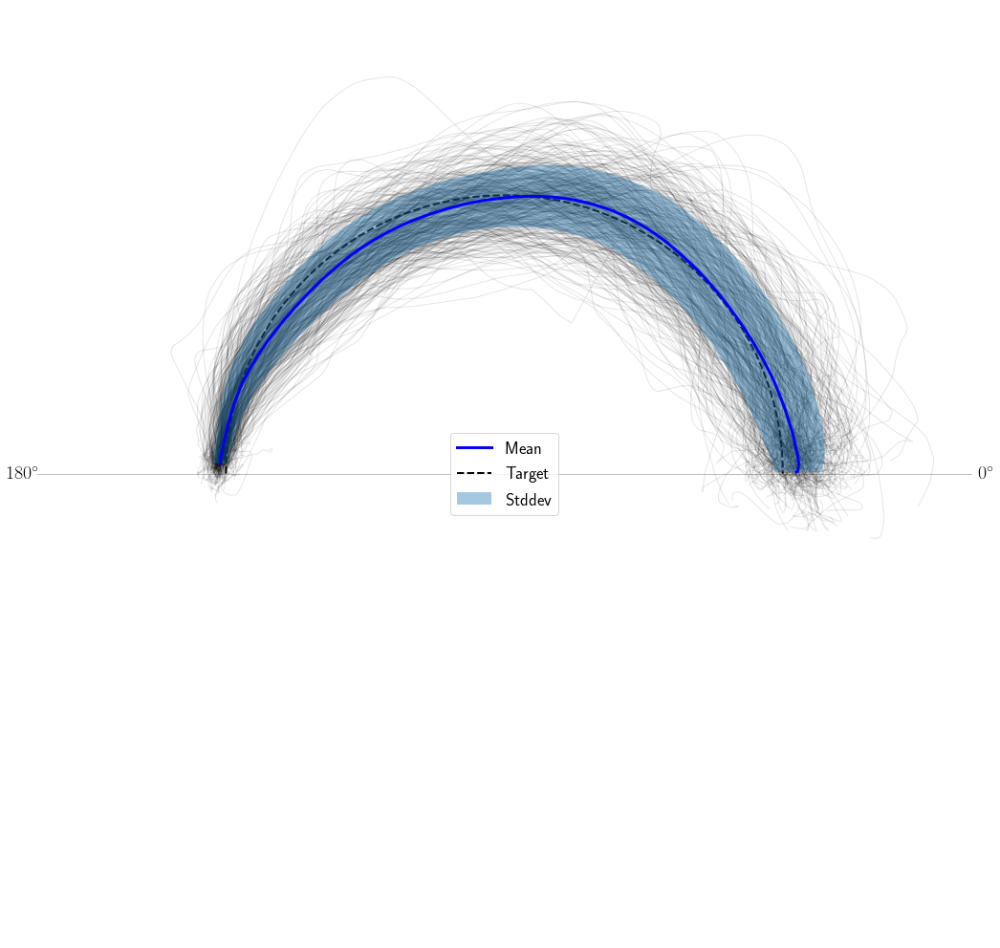

In [440]:
polar_fig, polar_ax = make_polar_plot()
total_mean = np.zeros(200)
trials = combine_trials_from_sessions(sessions, target=TARGET)
trajectories = np.stack([t.warped_polar_trajectory for t in trials])
std = np.std(trajectories, axis=0)
mean = np.mean(trajectories, axis=0)
for i, t in enumerate(trajectories):
    polar_ax.plot(t[0],t[1],"k",alpha=0.1,linewidth=1)

polar_ax.plot(mean[0],mean[1],'b', zorder=100,label="Mean")
polar_ax.fill_between(mean[0], mean[1]+std[1], mean[1]-std[1], 'b', alpha=.4, zorder=100,label="Stddev")
interp_arc = generate_arc(200, polar=True).T
polar_ax.plot(interp_arc[1],interp_arc[0],'--k',LineWidth=2, label="Target")
polar_ax.legend(loc="center",fontsize=18)

## trimming holding periods

if we can trim the beginning and ending holding periods off the trajectories, alignment might be simplified

I tried:
    - theta and theta-dot thresholds
        - first point where theta < pi and theta-dot < 0 
    - second derivative min/max
    - kneedle algorithm
   
Kneed seems to work the best

In [462]:
from kneed import KneeLocator

def distance_between_points(trial):
    t = trial.polar_trajectory[0]
#     t = trial.polar_trajectory
#     d = t[:,1:] - t[:,:-1]
#     d = np.linalg.norm(d,axis=0)
    d = np.abs(t[1:] - t[:-1])
    return d / np.max(d)

def trajectory_norm_derivative(trial):
    return np.diff(np.linalg.norm(trial.polar_trajectory,axis=0),1)

def derivative_norm(trial):
    return np.linalg.norm(trial.polar_derivative,axis=0)

def max_curvature(a):
    second_diff = np.diff(a,2)
    return np.max(second_diff),np.argmin(second_diff)

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

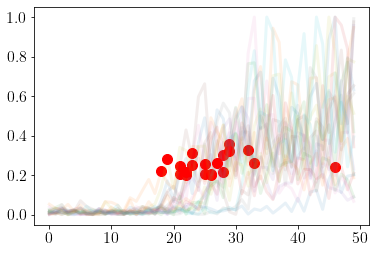

In [465]:
trials = combine_trials_from_sessions(subject_sessions[SUBJECT][1:-1],TARGET)
for trial in trials[:20]:
    # trial = trials[120]
    d = distance_between_points(trial)
    plt.plot(d[:50],alpha=0.1)
    idx = np.where(d>0.2)[0][0]
    plt.plot(idx,d[idx],"or")

empty
empty


<Figure size 864x864 with 0 Axes>

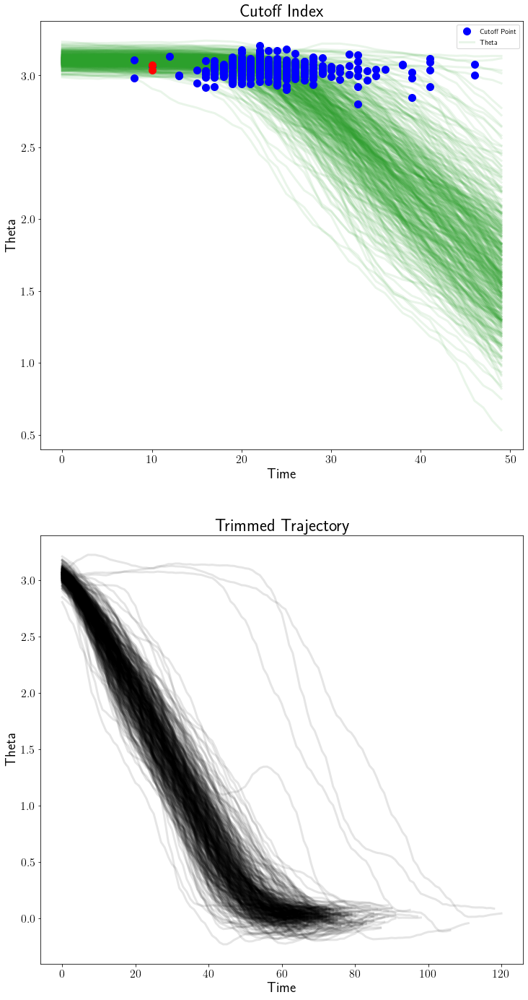

In [466]:
plt.figure(figsize=(12,12))
fig, axes = plt.subplots(2,1,figsize=(12,24))
dotax = axes[0]
trajax = axes[1]

trajax.set_xlabel("Time")
trajax.set_ylabel("Theta")
trajax.set_title("Trimmed Trajectory")
wait_times = []
for trial in all_trials:
    t = trial.polar_trajectory[0]
    d = distance_between_points(trial)
    th, = dotax.plot(t[:50],"tab:green",alpha=0.1)
    didx = np.where(d[:50]>.2)[0]
    if len(didx) > 0:
        idx = didx[0]
        color="blue"
        zorder=100
    else:
        print("empty")
        idx = 10
        color="red"
        zorder=500
    wait_times.append(idx)
    ih, = dotax.plot(idx,t[idx],"o",color=color,zorder=zorder)
    trajax.plot(t[idx:],"-k",alpha=0.1)
#     kneedle = KneeLocator(range(cutoff), t[:cutoff], S=1.0, curve="concave", direction="decreasing")
#     idx = kneedle.elbow
dotax.set_xlabel("Time")
dotax.set_ylabel("Theta")
dotax.set_title("Cutoff Index")
dotax.legend([ih,th],["Cutoff Point","Theta"])

(186,) (219,)


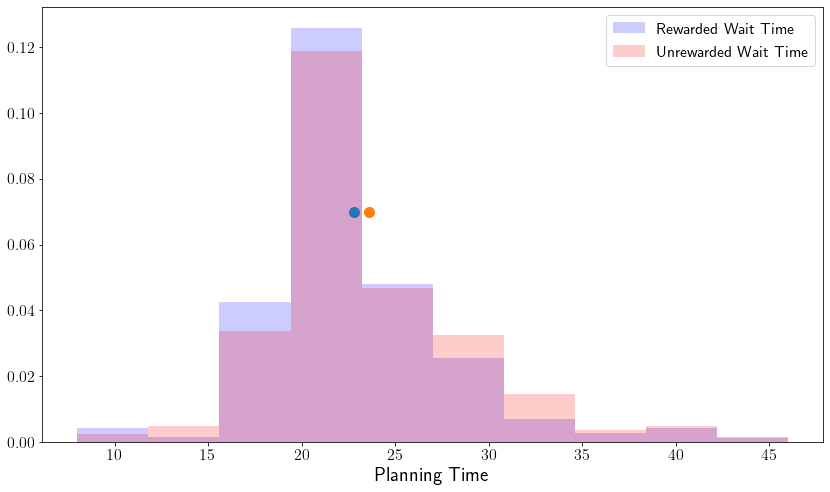

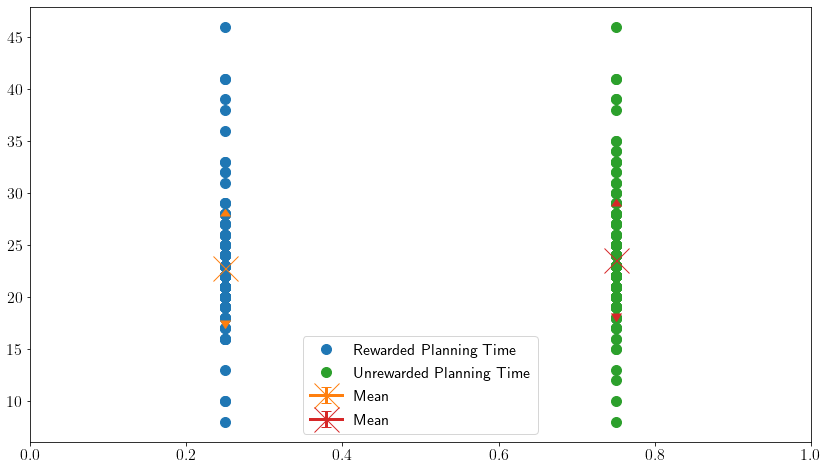

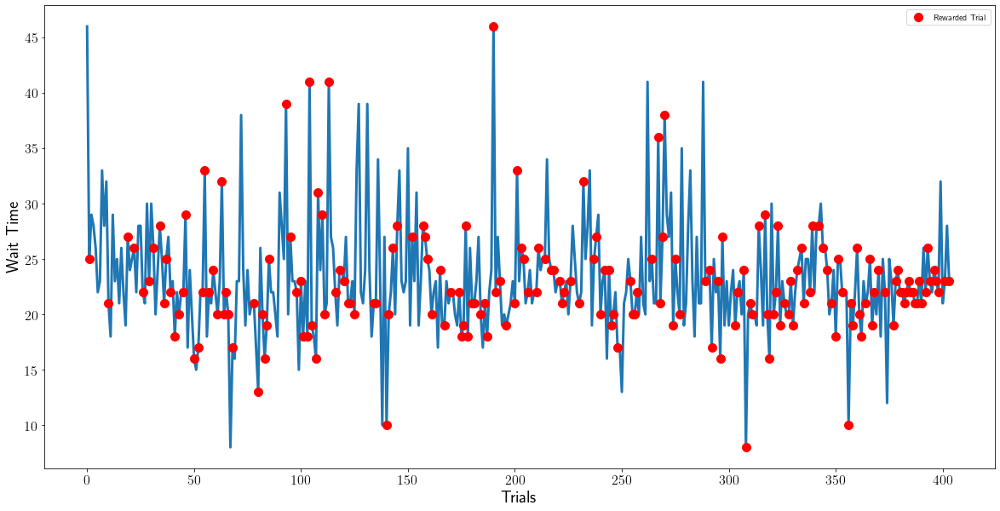

In [472]:
wait_times=np.array(wait_times)
reward = reward_stack[:,0]
rwt = wait_times[reward==True]
urwt = wait_times[reward==False]
print(rwt.shape,urwt.shape)

plt.figure(figsize=(14,8))
plt.hist(rwt,alpha=0.2,color="b",label="Rewarded Wait Time",density=True)
plt.hist(urwt,alpha=0.2,color="r",label="Unrewarded Wait Time",density=True)
plt.plot(rwt.mean(),.07,'o')
plt.plot(urwt.mean(),.07,'o')
plt.legend(fontsize=16)
plt.xlabel("Planning Time")

plt.figure(figsize=(14,8))
plt.plot(np.ones(len(rwt))*0.25,rwt,"o",label="Rewarded Planning Time")
plt.errorbar(0.25,np.mean(rwt),yerr=np.std(rwt),uplims=True,lolims=True,marker="x",markersize=25,label="Mean")

plt.plot(np.ones(len(urwt))*0.75,urwt,"o",label="Unrewarded Planning Time")
plt.errorbar(0.75,np.mean(urwt),yerr=np.std(urwt),uplims=True,lolims=True,marker="x",markersize=25,label="Mean")

plt.xlim([0,1])
plt.legend(fontsize=16)

plt.figure(figsize=(20,10))
plt.plot(wait_times)
plt.plot(np.where(reward==True)[0],rwt,'ro',label="Rewarded Trial")
plt.xlabel("Trials")
plt.ylabel("Wait Time")
plt.legend()

## dynamic time warping

### find median reference $\theta$ trajectory

In [ ]:
combined_trials = [t for t in combine_sessions(subject_sessions[SUBJECT][1:-1],TARGET)]
combined_trajectories = [t.polar_trajectory for t in combined_trials]
sorted_lengths = sorted([max(t.shape) for t in combined_trajectories])
median_trajectory = find_median_length_trajectory(combined_trajectories)

plt.figure(figsize=(10,10))
plt.plot(sorted_lengths, label="Length")
plt.plot(len(sorted_lengths)//2,median_trajectory.shape[1],'o',label="Median Lenth")
plt.xlabel("Trial")
plt.ylabel("Trajectory Length")
plt.title(f"Subject {SUBJECT} Target {TARGET} Trajectory Lengths")
plt.legend()
# use this median-length trajectory as the reference trajectory for warping
fig, axes = plt.subplots(2,1,figsize=(10,10))
axes[0].plot(median_trajectory[0])
# plt.plot(combined_trajectories[lens_sorted_indices[len(lens)//2 + 1]][0])
# plt.plot(combined_trajectories[lens_sorted_indices[len(lens)//2 -1 ]][0])
axes[0].set_title("Median-Length Trajectory")
axes[1].set_xlabel("Time Sample")
axes[0].set_ylabel("Theta [rad]")
axes[1].set_ylabel("Radius")
axes[1].plot(median_trajectory[1])

# parametric interpolation

## apply warp + interp on trajectory stacks 

In [ ]:
# interped
interped_trajectories = []
for trajectory in combined_trajectories:
    interped_trajectories.append(apply_interpolation(trajectory))
interped_trajectories = np.stack(interped_trajectories)

# warped
# use median length trajectory as reference
median_trajectory = find_median_length_trajectory(combined_trajectories)
warped_trajectories = []
for trajectory in combined_trajectories:
    warped_trajectories.append(apply_time_warping(trajectory, median_trajectory))
warped_trajectories = np.stack(warped_trajectories)

# interp + warp
# use mean of interpolated as reference
interped_mean = np.mean(interped_trajectories,axis=0)
interped_warped_trajectories = []
for trajectory in interped_trajectories:
    interped_warped_trajectories.append(apply_time_warping(trajectory, interped_mean))
interped_warped_trajectories = np.stack(interped_warped_trajectories)

# warp + interp
warped_interped_trajectories = []
for trajectory in warped_trajectories:
    warped_interped_trajectories.append(apply_interpolation(trajectory))
warped_interped_trajectories = np.stack(warped_interped_trajectories)

fig, axes = plt.subplots(2,1,figsize=(12,12))
fig.suptitle("Warping and Interpolation",fontsize=22)
sidx = 20 # 43*len(combined_trajectories)//64
eidx = 23 # 44*len(combined_trajectories)//64
for i in range(sidx,eidx,2):
    oh, = axes[0].plot(combined_trajectories[i][0],"k")
    wh, = axes[0].plot(warped_trajectories[i][0],"b")
    ih, = axes[0].plot(interped_trajectories[i][0],"g")
    wih, = axes[0].plot(warped_interped_trajectories[i][0],"r")
    iwh, = axes[0].plot(interped_warped_trajectories[i][0],"c")
    
    oh, = axes[1].plot(combined_trajectories[i][1],"k")
    wh, = axes[1].plot(warped_trajectories[i][1],"b")
    ih, = axes[1].plot(interped_trajectories[i][1],"g")
    wih, = axes[1].plot(warped_interped_trajectories[i][1],"r")
    iwh, = axes[1].plot(interped_warped_trajectories[i][1],"c")
axes[0].legend([oh,wh,ih,wih,iwh],["original","warped","interpolated","warped + interpolated","interpolated+ warped"])
axes[1].legend([oh,wh,ih,wih,iwh],["original","warped","interpolated","warped + interpolated","interpolated+ warped"])
axes[0].set_ylabel("Theta")
axes[1].set_xlabel("Index")
axes[1].set_ylabel("Radius")

fig, axes = plt.subplots(2,1,figsize=(15,9))
fig.suptitle("Trajectory Averages",fontsize=22)
axes[0].plot(np.mean(warped_trajectories,axis=0)[0],"b",label="warped")
axes[0].plot(np.mean(interped_trajectories,axis=0)[0],"g",label="interpolated")
axes[0].plot(np.mean(warped_interped_trajectories,axis=0)[0],"r",label="warped + interpolated")
axes[0].plot(np.mean(interped_warped_trajectories,axis=0)[0],"c",label="interpolated+ warped")
axes[0].legend()
axes[0].set_ylabel("Theta")
axes[1].plot(np.mean(warped_trajectories,axis=0)[1],"b",label="warped")
axes[1].plot(np.mean(interped_trajectories,axis=0)[1],"g",label="interpolated")
axes[1].plot(np.mean(warped_interped_trajectories,axis=0)[1],"r",label="warped + interpolated")
axes[1].plot(np.mean(interped_warped_trajectories,axis=0)[1],"c",label="interpolated+ warped")
axes[1].legend()
axes[1].set_ylabel("Radius")
axes[1].set_xlabel("Index")

# takeaways

- `warping` introduces noise/artifacts, but perhaps is worth for time alignment?
- interpolation seems to "wash out" some features on averaging, as expected
- `interpolation+warping` seems to make the most sense to me

## movement times

In [ ]:
sessions = subject_sessions[SUBJECT][1:-1]
times = np.array([t.MT for t in combine_sessions(sessions,TARGET)])
rewards = np.array([t.reward for t in combine_sessions(sessions,TARGET)])
print("num movements: ", len(times))
plt.hist(times,color='b',alpha=0.3,density=True,label="all")
# * is AND, + is OR
rtimes = times[rewards]
plt.hist(rtimes,color='g',alpha=0.3,density=True,label="successful")
print("num successful: ", len(rtimes))
urtimes = times[np.invert(rewards)]
plt.hist(urtimes,color='r',alpha=0.3,density=True,label="unsuccessful")
plt.title(" ".join(session.name.split(".")[:-1]) + " movement times")
plt.xlabel("time [ms]")
print("num unsuccessful: ", len(urtimes))
plt.legend()

## movement times outside of allowable

In [ ]:
inMT_stack = np.array([t.inMT for t in combine_sessions(sessions,TARGET)])
MT_stack = np.array([t.MT for t in combine_sessions(sessions,TARGET)])
req_MT_stack = np.array([t.requiredMT for t in combine_sessions(sessions,TARGET)])
print(np.round(np.abs(MT_stack[inMT_stack==False] - 800)/10))

# success fraction over sessions

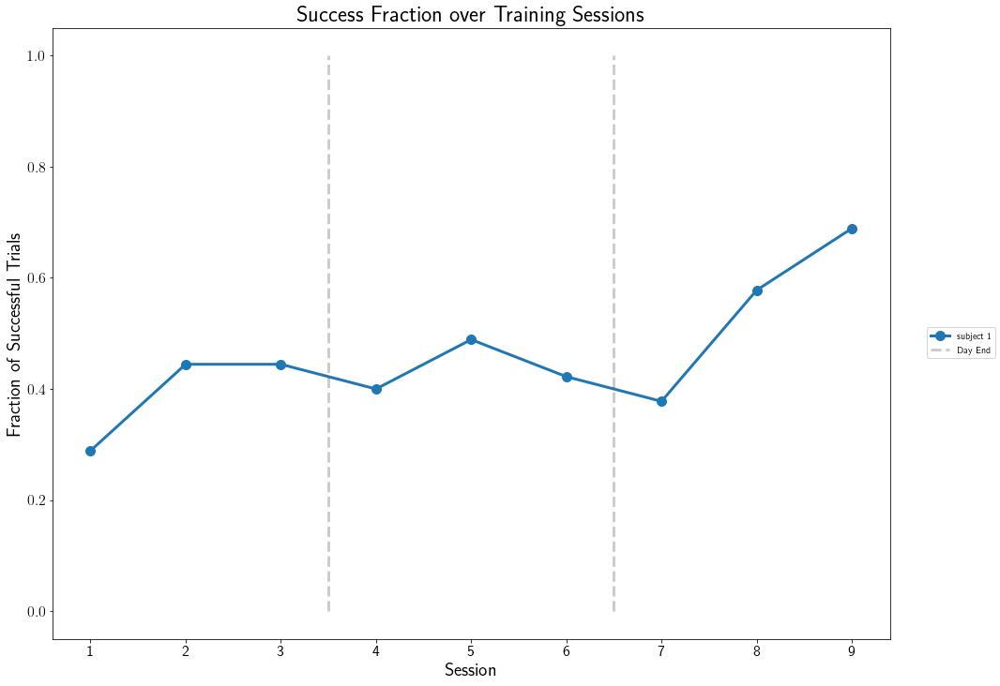

In [441]:
plt.figure(figsize=(16,12))
plt.xlabel("Session")
plt.ylabel("Fraction of Successful Trials")
for i, sessions in enumerate(subject_sessions):
    hit_fractions = []
    for session in sessions[1:-1]:
        trials = session.combine_trials(TARGET)
        num_successes = sum([1 for s in trials if s.reward == True])
        num_trials = len(trials)
        hit_fractions.append(num_successes/num_trials)    
    plt.plot(hit_fractions,'-o', label="subject " + str(i+1))
plt.xticks(list(range(9)))
plt.gca().set_xticklabels([str(i) for i in list(range(1,12))])
plt.plot([2.5,2.5],[0,1],"--k",alpha=0.2)
plt.plot([5.5,5.5],[0,1],"--k",alpha=0.2,label="Day End")
plt.title("Success Fraction over Training Sessions")
plt.gcf().legend(loc="center right")

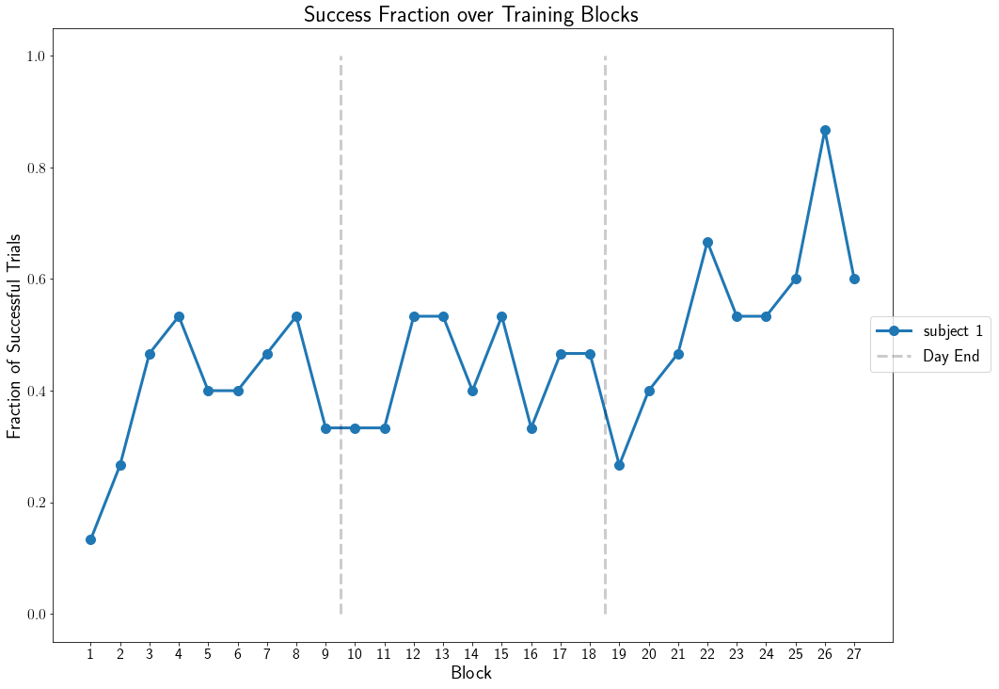

In [442]:
plt.figure(figsize=(16,12))
for i, sessions in enumerate(subject_sessions):
    hit_fractions = []
    for session in sessions[1:-1]:
        for block in session.get_blocks(TARGET):
            trials = block.combine_trials()
            num_successes = sum([1 for s in trials if s.reward == True])
            num_trials = len(trials)
            hit_fractions.append(num_successes/num_trials)    
    plt.plot(hit_fractions,'-o', label="subject " + str(i+1))
plt.xlabel("Block")
plt.ylabel("Fraction of Successful Trials")
plt.xticks(list(range(27)))
plt.gca().set_xticklabels([str(i) for i in list(range(1,28))])
plt.plot([8.5,8.5],[0,1],"--k",alpha=0.2)
plt.plot([17.5,17.5],[0,1],"--k",alpha=0.2,label="Day End")
plt.title("Success Fraction over Training Blocks")
plt.gcf().legend(loc="center right",fontsize=18)

# reward function over blocks

$$
\mathcal{R}(\tau) = \sum_t^T{\Psi(\mathbf{x}(t))}
$$

Where $\Psi$ is an indicator function

$$
\begin{equation}
  \Psi(x(t)) =
    \begin{cases}
      0 & \textrm{R}_\textrm{min} < x(t) < \textrm{R}_\textrm{max} \\
      1 & \text{otherwise}
    \end{cases}       
\end{equation}
$$

The goal here is to build a scalar cost function for each trial. The problem is that the cost of each trial is a combination of time and position requirements. 

We might try to find a weighted combination of these time and position conditions: `position_weight*position_error + time_weight*time_error`. Trials without error have 0 cost, as the cost is a nonlinear function of time and position. 

In [337]:
def in_tube(trial, offset=50, R=256):
    Rmax=R+offset
    Rmin=R-offset
    trajectory = trial.polar_trajectory[1]
    return np.all(np.logical_and(trajectory >= Rmin, trajectory <= Rmax))

def cost(trial,offset=50,R=256):
    if in_tube(trial,offset):
        return 0
    else:
        Rmax=R+offset
        Rmin=R-offset
        trajectory = trial.polar_trajectory[1]
        return np.sum(np.logical_and(trajectory > Rmin, trajectory < Rmax))

perfect_offset: 50.303030303030305


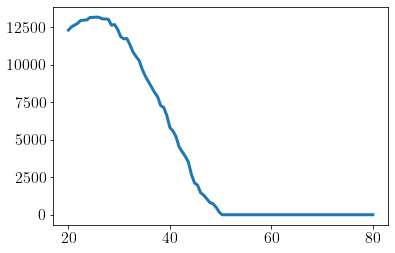

In [338]:
costs = []
x = np.linspace(20,80,100)
for offset in x:
    costs.append(np.sum([cost(trial,offset) for i,trial in enumerate(all_trials) if trial.reward == True]))
plt.plot(x, costs)
perfect_offset = x[np.argwhere([c==0 for c in costs]).reshape(-1)[0]]
print("perfect_offset:",perfect_offset)

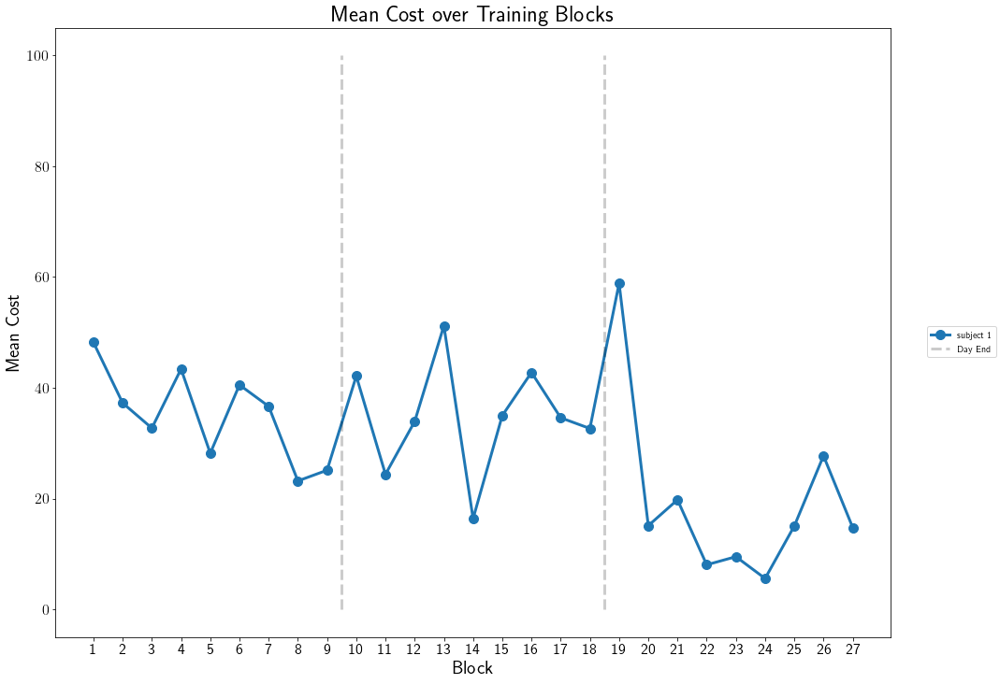

In [339]:
plt.figure(figsize=(16,12))
plt.xlabel("Block")
plt.ylabel("Mean Cost")
for i, sessions in enumerate(subject_sessions):
    block_cost_means = []
    for session in sessions[1:-1]:
        for block in session.get_blocks(TARGET):
            trials = block.combine_trials()
            costs = []
            for trial in trials:
                costs.append(cost(trial))
            block_cost_means.append(np.mean(costs))
    plt.plot(block_cost_means,"-o",label="subject " + str(i+1))
plt.xticks(list(range(27)))
plt.gca().set_xticklabels([str(i) for i in list(range(1,28))])
plt.plot([8.5,8.5],[0,100],"--k",alpha=0.2)
plt.plot([17.5,17.5],[0,100],"--k",alpha=0.2,label="Day End")
plt.title("Mean Cost over Training Blocks")
plt.gcf().legend(loc="center right")

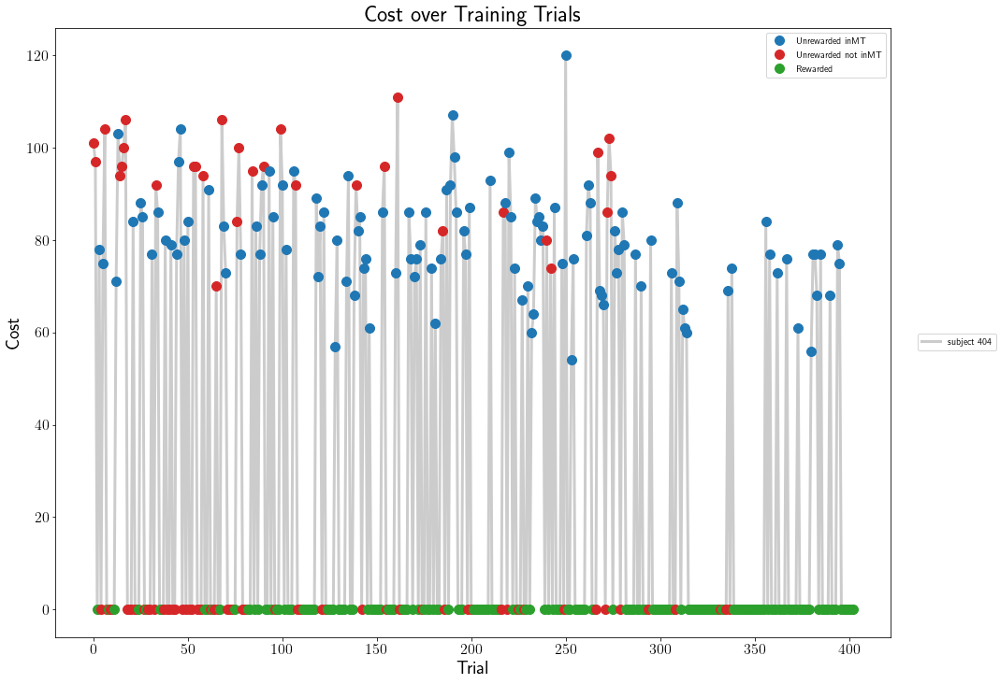

In [340]:
plt.figure(figsize=(16,12))
i = 0
for i, sessions in enumerate(subject_sessions[:1]):
    costs = []
    for session in sessions[1:-1]:
        for trial in session.combine_trials(TARGET):
            if trial.reward == False:
                if trial.inMT == True:
                    uinMT, = plt.plot(i,cost(trial),'o',color='tab:blue',zorder=200)
                elif trial.inMT == False:
                    unotinMT, = plt.plot(i,cost(trial),'o',color='tab:red',zorder=200)
            elif trial.reward == True:
                r, = plt.plot(i,cost(trial),'o',color='tab:green',zorder=200)
            costs.append(cost(trial))    
            i+=1
plt.plot(costs,"-k",label="subject " + str(i+1),alpha=0.2)
plt.xlabel("Trial")
plt.ylabel("Cost")
plt.title("Cost over Training Trials")
plt.gcf().legend(loc="center right")
plt.legend(labels=["Unrewarded inMT","Unrewarded not inMT","Rewarded"],handles=[uinMT,unotinMT,r])
# for i in list(range(0,406,15)):
#     plt.plot([i,i],[0,150],"--k",alpha=0.2)

# means over sessions

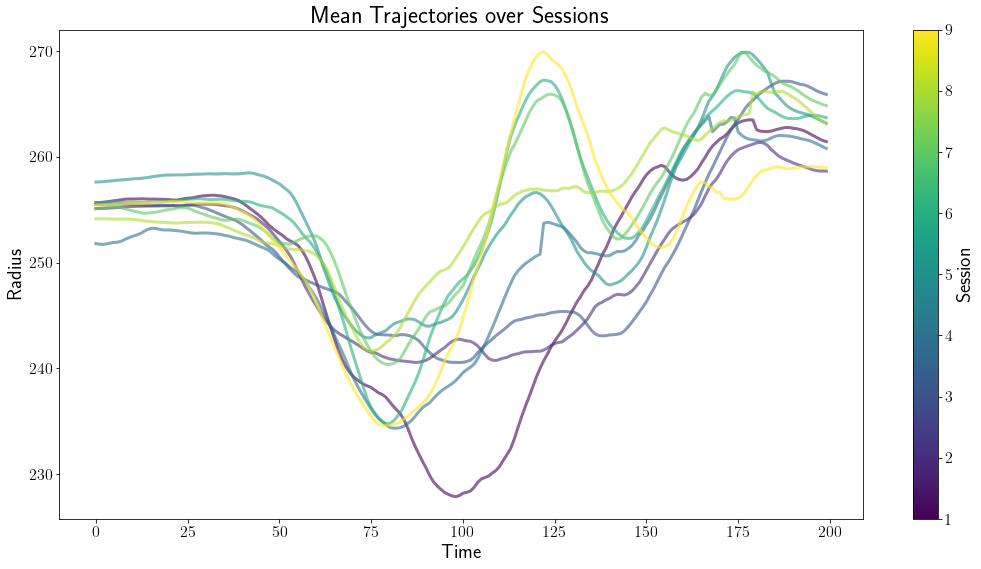

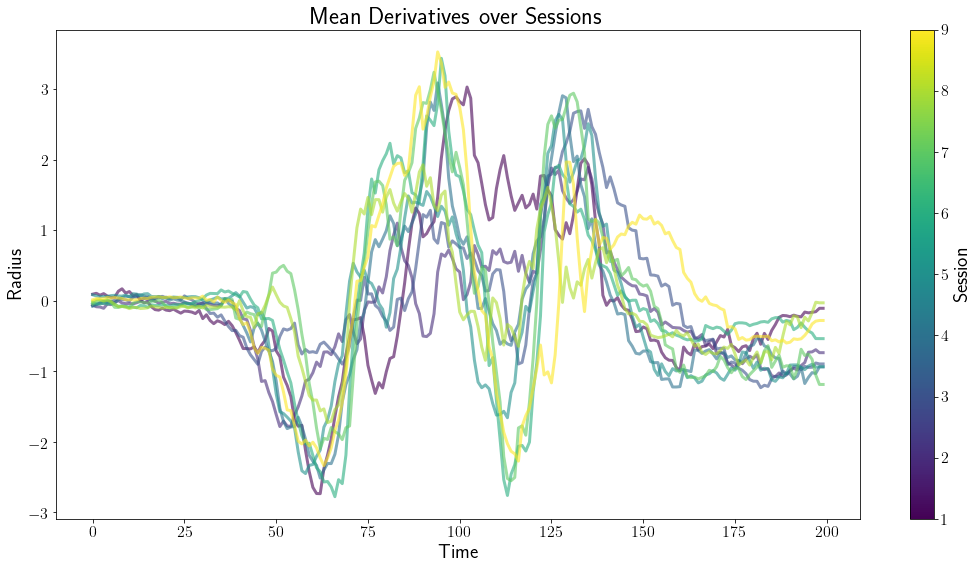

In [497]:
trajectory_means = []
sessions = subject_sessions[SUBJECT][1:-1]
block_lists = combine_blocks_from_sessions(sessions,TARGET)
session_lists = [combine_trials_from_sessions([session],TARGET) for session in sessions]

trajectory_means = []
for sl in session_lists:
    trajectories = []
    for trial in sl:
        trajectories.append(np.vstack([trial.warped_polar_trajectory,trial.warped_polar_derivative]))
    trajectories = np.stack(trajectories)
    trajectory_means.append(np.mean(trajectories, axis=0))

cmap = cm.viridis
colors = make_color_vector(cmap, len(trajectory_means))
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(colors))
fig, ax = plt.subplots(1,1,figsize=(18,9))
for i, tm in enumerate(trajectory_means):
    ax.plot(tm[1], color=colors[i], alpha=0.6)
ax.set_title("Mean Trajectories over Sessions")
ax.set_xlabel("Time")
ax.set_ylabel("Radius")
fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax,label="Session")

cmap = cm.viridis
colors = make_color_vector(cmap, len(trajectory_means))
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(colors))
fig, ax = plt.subplots(1,1,figsize=(18,9))
for i, tm in enumerate(trajectory_means):
    ax.plot(tm[3], color=colors[i], alpha=0.6)
ax.set_title("Mean Derivatives over Sessions")
ax.set_xlabel("Time")
ax.set_ylabel("Radius")
fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax,label="Session")

27 (4, 200)


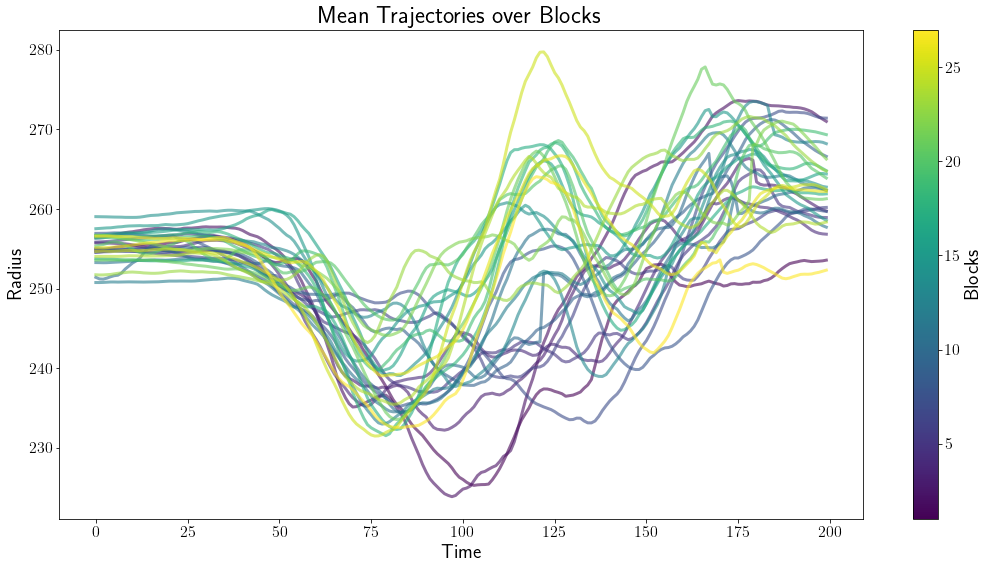

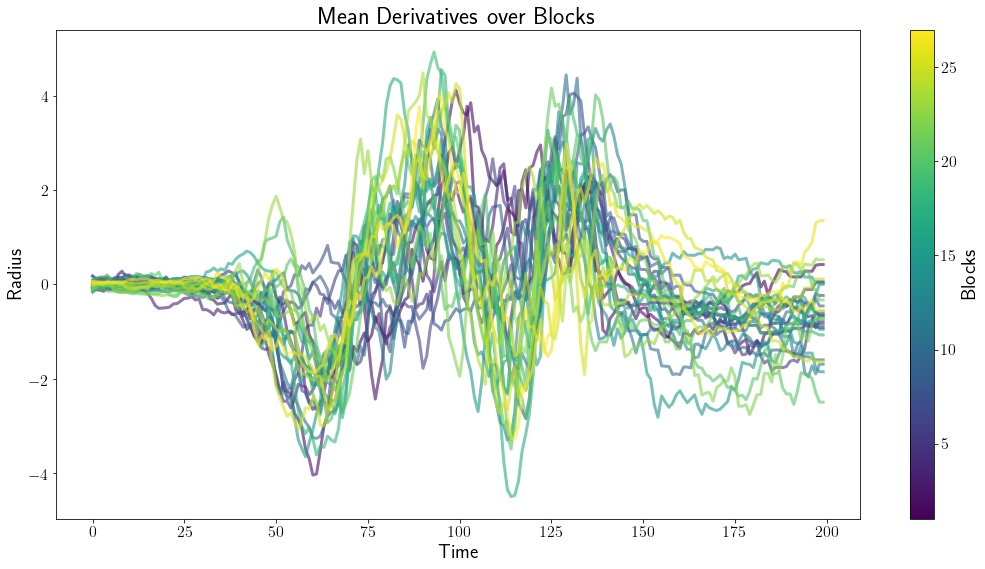

In [498]:
trajectory_means = []
for bl in block_lists:
    trajectories = []
    for trial in bl.trials:
        trajectories.append(np.vstack([trial.warped_polar_trajectory,trial.warped_polar_derivative]))
    trajectories = np.stack(trajectories)
    trajectory_means.append(np.mean(trajectories, axis=0))
print(len(trajectory_means),trajectory_means[0].shape)

cmap = cm.viridis
colors = make_color_vector(cmap, len(trajectory_means))
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(colors))
fig, ax = plt.subplots(1,1,figsize=(18,9))
for i, tm in enumerate(trajectory_means):
    plt.plot(tm[1], color=colors[i], alpha=0.6)
ax.set_title("Mean Trajectories over Blocks")
ax.set_xlabel("Time")
ax.set_ylabel("Radius")
fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax,label="Blocks")

cmap = cm.viridis
colors = make_color_vector(cmap, len(trajectory_means))
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(colors))
fig, ax = plt.subplots(1,1,figsize=(18,9))
for i, tm in enumerate(trajectory_means):
    plt.plot(tm[3], color=colors[i], alpha=0.6)
ax.set_title("Mean Derivatives over Blocks")
ax.set_xlabel("Time")
ax.set_ylabel("Radius")
fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax,label="Blocks")

# variance per timepoint over sessions

### over blocks

Text(0.5, 0, 'Block')

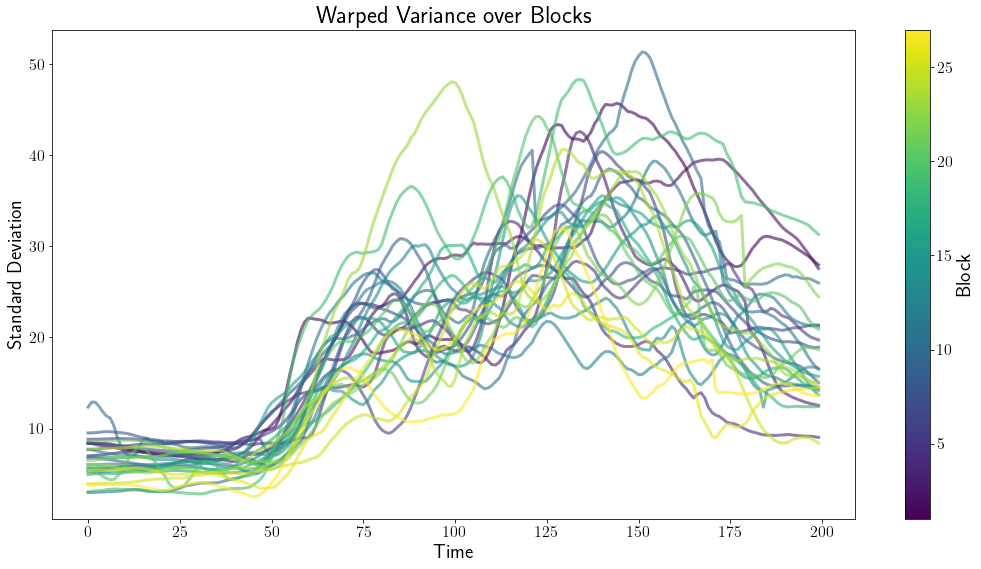

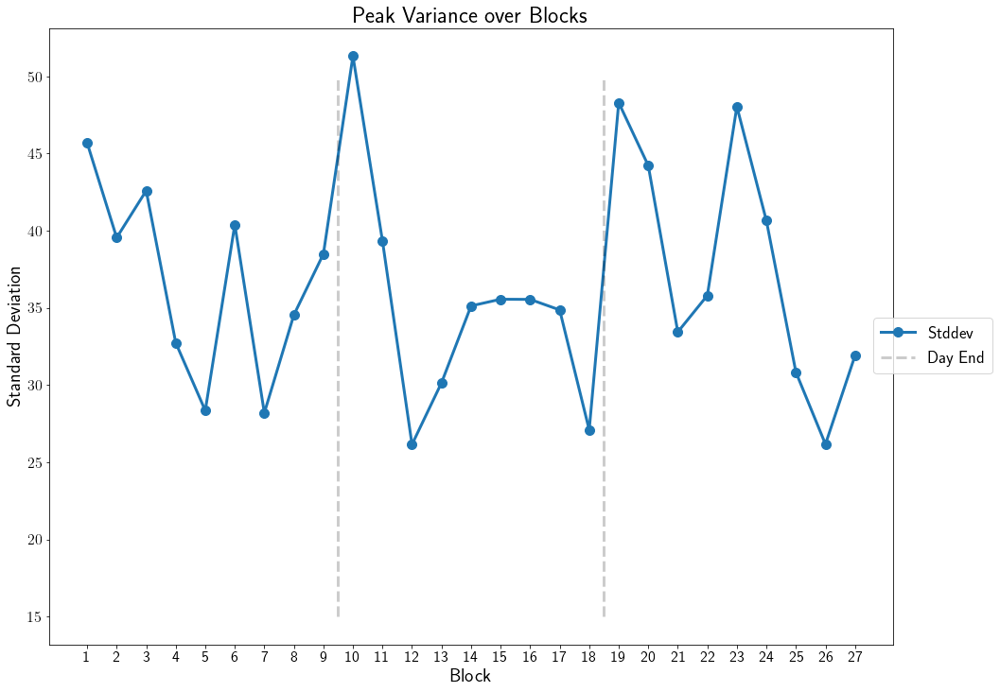

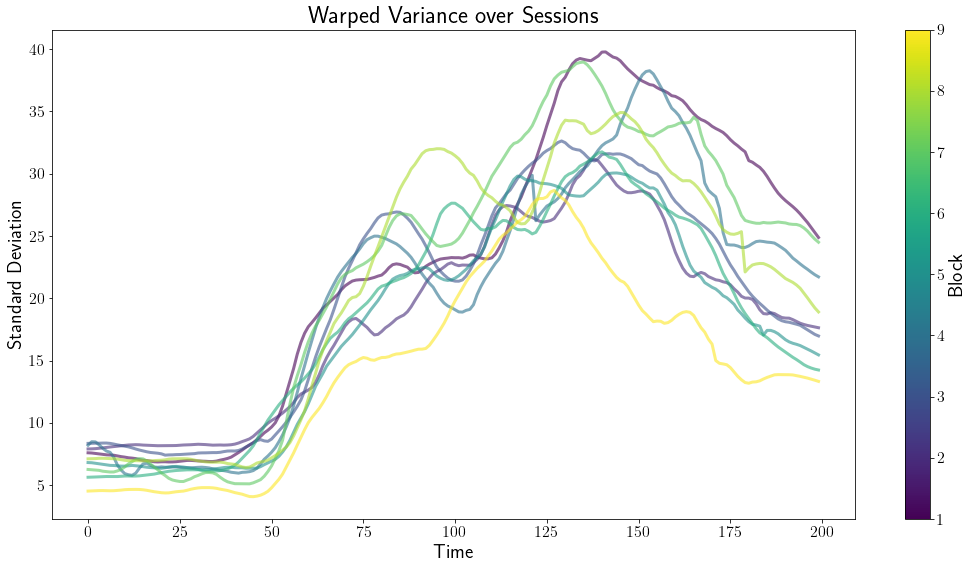

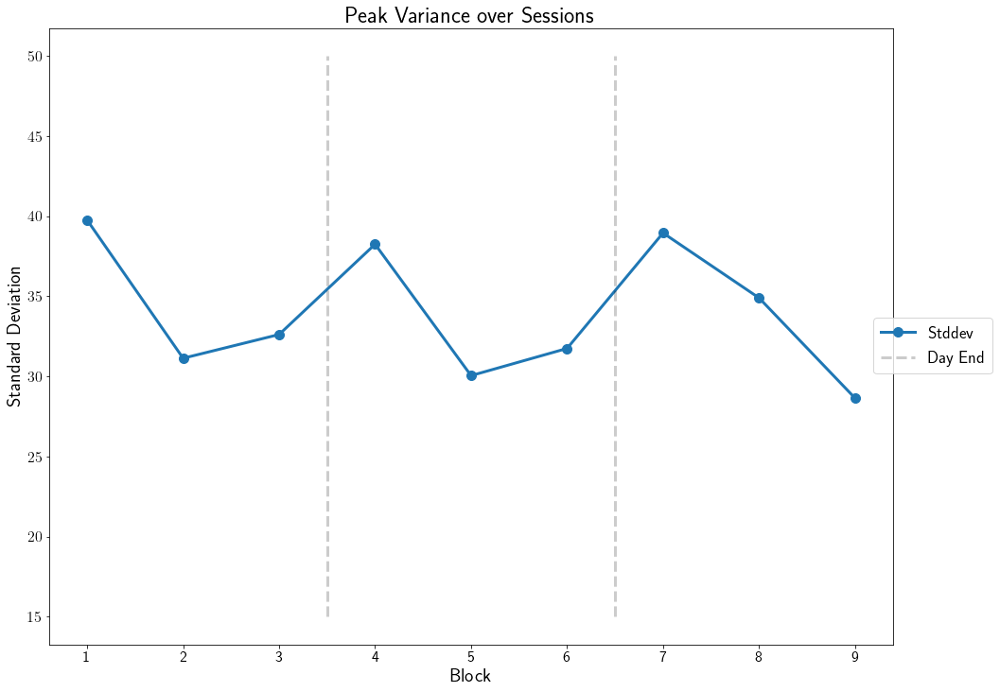

In [501]:
trajectory_stds = []
for bl in block_lists:
    trajectories = []
    for trial in bl.trials:
        trajectories.append(np.vstack([trial.warped_polar_trajectory,trial.warped_polar_derivative]))
    trajectories = np.stack(trajectories)
    trajectory_stds.append(np.std(trajectories, axis=0))

cmap = cm.viridis
colors = make_color_vector(cmap, len(trajectory_means))
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(colors))
fig, ax = plt.subplots(1,1,figsize=(18,9))
for i, tm in enumerate(trajectory_stds):
    ax.plot(tm[1], color=colors[i], alpha=0.6)
ax.set_title("Warped Variance over Blocks")
ax.set_ylabel("Standard Deviation")
ax.set_xlabel("Time")
fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, label="Block")

fig, ax = plt.subplots(1,1,figsize=(16,12))
ax.plot([np.max(tm[1]) for tm in trajectory_stds], "-o",label="Stddev")
plt.xticks(list(range(27)))
ax.set_title("Peak Variance over Blocks")
ax.set_xticklabels([str(i) for i in list(range(1,28))])
ax.plot([8.5,8.5],[15,50],"--k",alpha=0.2)
ax.plot([17.5,17.5],[15,50],"--k",alpha=0.2,label="Day End")
fig.legend(loc="center right",fontsize=18)
ax.set_ylabel("Standard Deviation")
ax.set_xlabel("Block")

trajectory_stds = []
for sl in session_lists:
    trajectories = []
    for trial in sl:
        trajectories.append(np.vstack([trial.warped_polar_trajectory,trial.warped_polar_derivative]))
    trajectories = np.stack(trajectories)
    trajectory_stds.append(np.std(trajectories, axis=0))

cmap = cm.viridis
colors = make_color_vector(cmap, len(session_lists))
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(colors))
fig, ax = plt.subplots(1,1,figsize=(18,9))
for i, tm in enumerate(trajectory_stds):
    ax.plot(tm[1], color=colors[i], alpha=0.6)
ax.set_title("Warped Variance over Sessions")
ax.set_ylabel("Standard Deviation")
ax.set_xlabel("Time")
fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, label="Block")

fig, ax = plt.subplots(1,1,figsize=(16,12))
ax.plot([np.max(tm[1]) for tm in trajectory_stds], "-o",label="Stddev")
plt.xticks(list(range(27)))
ax.set_title("Peak Variance over Sessions")
ax.set_xticklabels([str(i) for i in list(range(1,28))])
ax.plot([2.5,2.5],[15,50],"--k",alpha=0.2)
ax.plot([5.5,5.5],[15,50],"--k",alpha=0.2,label="Day End")
fig.legend(loc="center right",fontsize=18)
ax.set_ylabel("Standard Deviation")
ax.set_xlabel("Block")

# heatmap of all trials

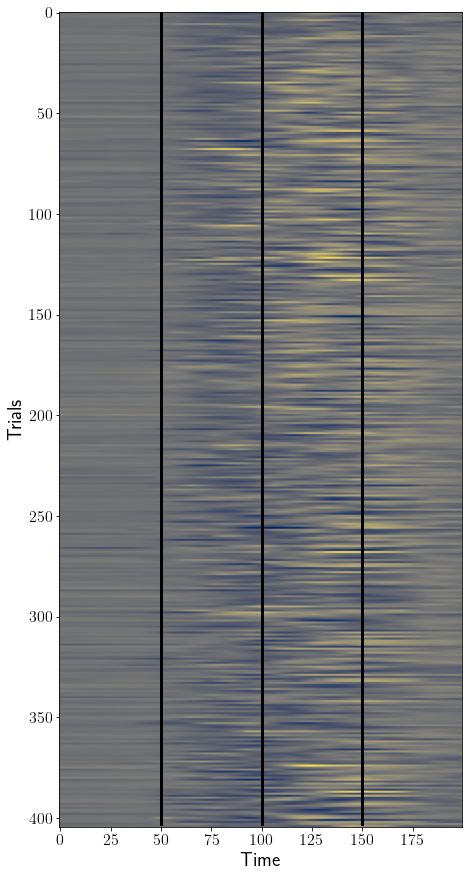

In [509]:
plt.figure(figsize=(25,15))
plt.imshow(curve_stack[:,1,:][::-1],cmap=cm.cividis,aspect="equal")
plt.xlabel("Time")
plt.ylabel("Trials")
plt.plot([50,50],[0,403],'k')
plt.plot([100,100],[0,403],'k')
plt.plot([150,150],[0,403],'k')

## heatmap of errors

In [34]:
# over trials, plot samples that are outside of the annulus
# red for above and blue for below, and over time for each trial
# the idea is to show how these errors evolve over sessions, etc 
# we hypothesize that errors will evolve hierarchically over trials...

# only use error trials
error_curves = np.vstack([curve_stack[i,1,:] for i in range(curve_stack.shape[0]) if reward_stack[i]==False])

(219, 200)


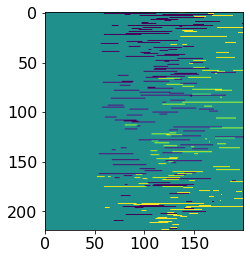

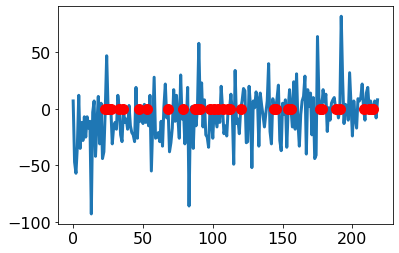

In [63]:
boolean_curves = np.zeros_like(error_curves)
boolean_curves[np.where(error_curves > (RADIUS+50))] = 1
boolean_curves[np.where(error_curves < (RADIUS-50))] = -1
print(boolean_curves.shape)
plt.imshow(boolean_curves)

plt.figure()
error_sums = np.array([sum(b) for b in boolean_curves])
plt.plot(error_sums)
zero_idxs, = np.where(error_sums==0)
plt.plot(zero_idxs,np.zeros_like(zero_idxs),'ro')


## movement speed

In [53]:
time_limits = all_trials[0].requiredMT

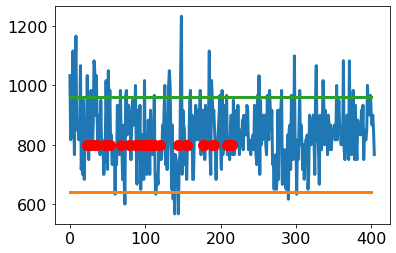

In [56]:
plt.plot([t.MT for t in all_trials])
plt.plot([0,400],[time_limits[0],time_limits[0]])
plt.plot([0,400],[time_limits[1],time_limits[1]])


# one-step-back euclidean difference

- build trajectory list, reward list
- compute derivatives
- interpolate trajectories
- interpolate derivatives
- whiten trajectories and derivatives (mean, std of each channel)
- compute t, r, tdot, rdot differences over trials 
- plot differences + reward for each channel 

### compute statistics for whitening...

In [57]:
## mean, std over all trajectories, all time points concatenated
# unroll all trajectories to compute point statistics
print(curve_stack.shape,derivative_stack.shape)
trajectory_mean = np.swapaxes(curve_stack,0,1).reshape(2,-1).mean(axis=1).reshape(2,1)
derivative_mean = np.swapaxes(derivative_stack,0,1).reshape(2,-1).mean(axis=1).reshape(2,1)
trajectory_std = np.swapaxes(curve_stack,0,1).reshape(2,-1).std(axis=1).reshape(2,1)
derivative_std = np.swapaxes(derivative_stack,0,1).reshape(2,-1).std(axis=1).reshape(2,1)
print("trajectory_mean",trajectory_mean)
print("derivative_mean",derivative_mean)

(405, 2, 200) (405, 2, 200)
trajectory_mean [[  1.69551709]
 [251.09888427]]
derivative_mean [[-0.03338128]
 [ 0.02914669]]


### whitening

In [58]:
def whiten_trajectory(trajectory,mean,std):
    return (trajectory - mean)/std

for trials in block_lists:
    for trial in trials:
        trial.whitened_trajectory = whiten_trajectory(trial.warped_polar_trajectory,trajectory_mean,trajectory_std)
        trial.whitened_derivative = whiten_trajectory(trial.warped_polar_derivative,derivative_mean,derivative_std)

### compute difference (trial k+1 - trial k) for trajectories and derivatives within blocks

In [59]:
# only take differences within blocks
for trials in block_lists:
    trials[0].difference_reward = None
    for i, current_trial in enumerate(trials[:-1]):
        next_trial = trials[i+1]
        next_trial.difference_reward = current_trial.reward
        next_trial.whitened_trajectory_difference = next_trial.whitened_trajectory - current_trial.whitened_trajectory
        next_trial.whitened_derivative_difference = next_trial.whitened_derivative - current_trial.whitened_derivative

## collect rewarded and unrewarded differences

In [60]:
rewarded_difference_trajectory_list = []
rewarded_difference_derivative_list = []
unrewarded_difference_trajectory_list = []
unrewarded_difference_derivative_list = []
labels = ["$\Theta$","r","$\dot{\Theta}$","$\dot{r}$"]
for trial in all_trials:
    if trial.difference_reward == True:
        rewarded_difference_trajectory_list.append(trial.whitened_trajectory_difference)
        rewarded_difference_derivative_list.append(trial.whitened_derivative_difference)
    elif trial.difference_reward == False:
        unrewarded_difference_trajectory_list.append(trial.whitened_trajectory_difference)
        unrewarded_difference_derivative_list.append(trial.whitened_derivative_difference)
        
rewarded_difference_stack = np.append(rewarded_difference_trajectory_list, rewarded_difference_derivative_list, axis=1)
unrewarded_difference_stack = np.append(unrewarded_difference_trajectory_list, unrewarded_difference_derivative_list, axis=1)
print("rewarded difference_stack: ",rewarded_difference_stack.shape)
print("unrewarded difference_stack: ",unrewarded_difference_stack.shape)
print("total: ",rewarded_difference_stack.shape[0]+unrewarded_difference_stack.shape[0])
n_outliers = sum([1 for session in sessions for trial in session.outlier_trials if trial.target==TARGET])
print(f"(15 trials - 1) * {len(block_lists)} blocks - {n_outliers} outliers = ",14*len(block_lists) - n_outliers)

rewarded difference_stack:  (176, 4, 200)
unrewarded difference_stack:  (202, 4, 200)
total:  378
(15 trials - 1) * 27 blocks - 0 outliers =  378


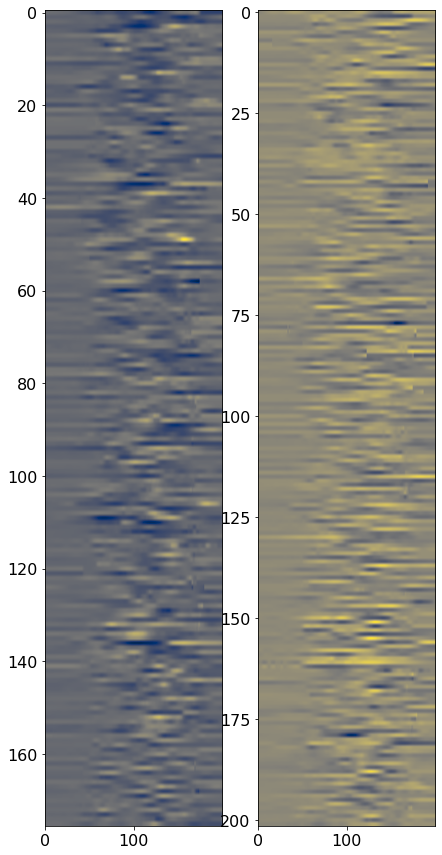

In [72]:
fig,axes = plt.subplots(1,2,figsize=(7,15))
axes[0].imshow(rewarded_difference_stack[:,1,:],cmap=cm.cividis,aspect="auto")
axes[1].imshow(unrewarded_difference_stack[:,1,:],cmap=cm.cividis,aspect="auto")

# make time histogram stack

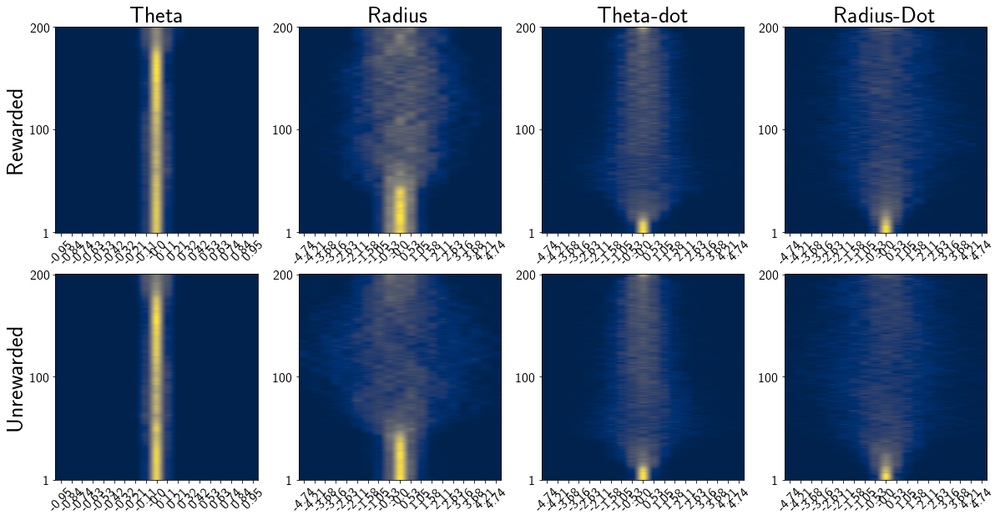

In [348]:
# designate a number of bins 
# designate bin locations? 
    # needed to properly align histograms vertically 
# compute histograms with bin arguments
# stack into matrix
# imshow matrix with vmin, vmax etc

def imshow_stack(stack,ax,nbins=20,width=10):
    n_timepoints = stack.shape[1]
    vals = np.empty((n_timepoints,nbins-1))
    midpoints = np.empty((n_timepoints,nbins-1))
    for i in range(n_timepoints):
        vals[i,:], bins = np.histogram(stack[:,i], density=True, bins=np.linspace(-width/2,width/2,nbins))
        midpoints[i,:] = [(b + bins[bi + 1]) / 2 for bi, b in enumerate(bins[:-1])]

    ax.imshow(vals[::-1],aspect="auto",cmap=cm.cividis)
    _ = ax.set_xticks(list(range(vals.shape[1])))
    _ = ax.set_xticklabels([str(round(m,2)) for m in midpoints[i]],rotation=45)
    _ = ax.set_yticks([0,99,199])
    _ = ax.set_yticklabels(["1","100","200"][::-1])
    return ax

fig, axes = plt.subplots(2,4,figsize=(20,10))
for a in range(4):
    if a == 0:
        width = 2
    else:
        width=10
    stack = rewarded_difference_stack[:,a,:]
    imshow_stack(stack, axes[0,a],width=width)
    stack = unrewarded_difference_stack[:,a,:]
    imshow_stack(stack, axes[1,a],width=width)
titles = ["Theta", "Radius", "Theta-dot","Radius-Dot"]
ylabels = ["Rewarded","Unrewarded"]
for i, title in enumerate(titles):
    axes[0,i].set_title(title,fontsize=28)
for i, yl in enumerate(ylabels):
    axes[i,0].set_ylabel(yl,fontsize=28)

## PCA over intertrial differences

In [349]:
def compute_svd(x):
    # features x samples 
    ms = x - np.mean(x,axis=0) # subtract mean of each trial ()
    return np.linalg.svd(ms.T) # time x trials

In [350]:
ru,rs,rv = compute_svd(rewarded_difference_stack[:,1,:])
rs = rs/np.sum(rs)
uru,urs,urv = compute_svd(unrewarded_difference_stack[:,1,:])
urs = urs/np.sum(urs)

Text(0.5, 0.96, 'Rewarded and Unrewarded Intertrial Difference Eigenmodes')

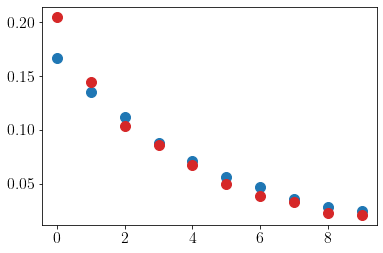

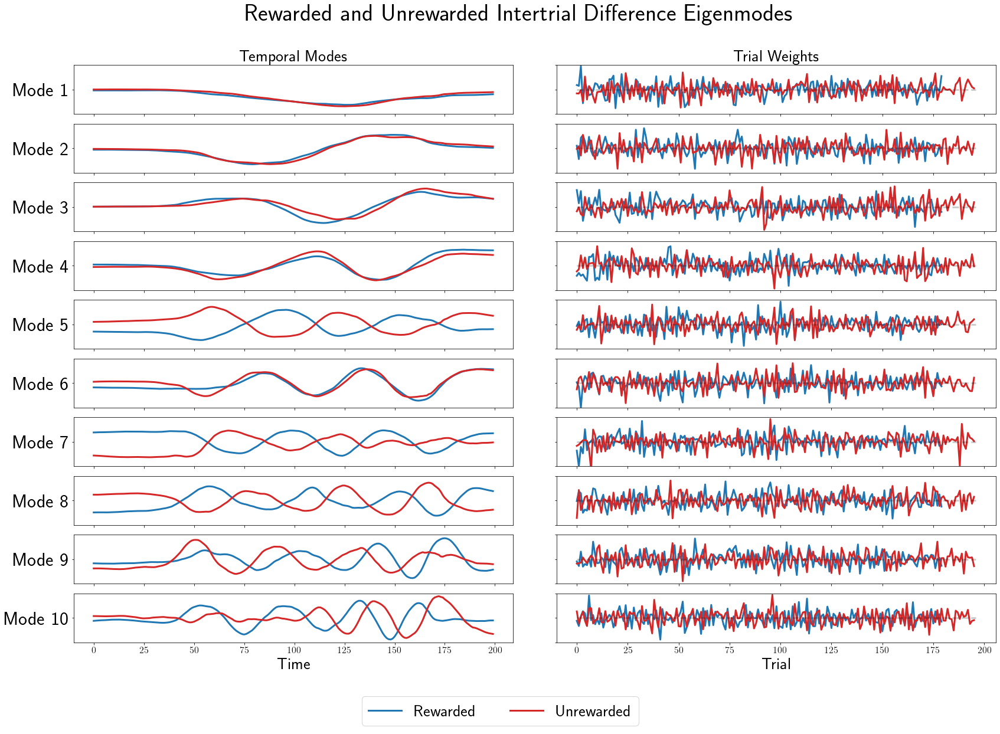

In [351]:
# eigenvectors of AA^T -- variance captured time point over trials 
num_modes = 10

plt.figure()
plt.plot(rs[:num_modes],'o',color="tab:blue")
plt.plot(urs[:num_modes],'o',color="tab:red")

ntrials = urv[0].shape[0]
fig, axes = plt.subplots(num_modes,2,figsize=(28,18))
plt.subplots_adjust(wspace=0.1)
alignment = [-1,-1,-1,1,1,-1,1,1,-1,1]
for i, n in enumerate(range(num_modes)):
    axes[n,0].plot(ru[:,n]*alignment[i],color="tab:blue")
    axes[n,1].plot(rv[n,:]*alignment[i],color="tab:blue")
    axes[n,0].plot(uru[:,n],color="tab:red")
    axes[n,1].plot(urv[n,:],color="tab:red")
    axes[n,1].plot([0,ntrials],[0,0],"--k",alpha=0.2)
    axes[n,0].label_outer()
    axes[n,0].set_ylim([-0.2,0.2])
    axes[n,0].set_yticklabels([])
    axes[n,0].set_yticks([0])
    axes[n,0].set_yticklabels([f"Mode {n+1}"],fontsize=32)
    axes[n,1].set_ylim([-0.25,0.25])
    axes[n,1].label_outer()
axes[0,0].set_title("Temporal Modes",fontsize=28)
axes[0,1].set_title("Trial Weights",fontsize=28)
axes[-1,0].set_xlabel("Time",fontsize=28)
axes[-1,1].set_xlabel("Trial",fontsize=28)

blueline=matplotlib.lines.Line2D([0], [0], linewidth=3, linestyle="-", color="tab:blue")
redline=matplotlib.lines.Line2D([0], [0], linewidth=3, linestyle="-", color="tab:red")
fig.legend((blueline,redline), ('Rewarded','Unrewarded'), 'lower center',fontsize=28,ncol=2)
fig.suptitle("Rewarded and Unrewarded Intertrial Difference Eigenmodes", y=0.96, fontsize=40)

$$X = AB = ABC$$

impose a smooth prior on the trial weights

r_k = sum_i{m}

r_k = w_r*sum_i(rewarded modes) + w_ur*sum(unrewarded modes)

SLOW FEATURE ANALYSIS

## compute means over all sessions

In [352]:
total_whitened_rewarded_means = np.mean(rewarded_difference_stack,axis=0)
total_whitened_unrewarded_means = np.mean(unrewarded_difference_stack,axis=0)

total_whitened_rewarded_vars = np.std(rewarded_difference_stack,axis=0)
total_whitened_unrewarded_vars = np.std(unrewarded_difference_stack,axis=0)

print("rewarded_means: ",total_whitened_rewarded_means.shape)
print("unrewarded_means: ",total_whitened_unrewarded_means.shape)

rewarded_means:  (4, 200)
unrewarded_means:  (4, 200)


## compute means per sessions (3 blocks per session)

In [353]:
session_whitened_rewarded_difference_means = []
session_whitened_unrewarded_difference_means = []
session_whitened_rewarded_difference_vars = []
session_whitened_unrewarded_difference_vars = []
for trials in session_lists:
    t_rewarded = np.stack([trial.whitened_trajectory_difference for trial in trials if trial.difference_reward == True])
    d_rewarded = np.stack([trial.whitened_derivative_difference for trial in trials if trial.difference_reward == True])
    t_unrewarded = np.stack([trial.whitened_trajectory_difference for trial in trials if trial.difference_reward == False])
    d_unrewarded = np.stack([trial.whitened_derivative_difference for trial in trials if trial.difference_reward == False])
    
    t_rewarded_mean = np.mean(t_rewarded,axis=0)
    d_rewarded_mean = np.mean(d_rewarded,axis=0)
    t_unrewarded_mean = np.mean(t_unrewarded,axis=0)
    d_unrewarded_mean = np.mean(d_unrewarded,axis=0)
    session_whitened_rewarded_difference_means.append(np.vstack([t_rewarded_mean,d_rewarded_mean]))
    session_whitened_unrewarded_difference_means.append(np.vstack([t_unrewarded_mean,d_unrewarded_mean]))

    t_rewarded_var = np.std(t_rewarded,axis=0)
    d_rewarded_var = np.std(d_rewarded,axis=0)
    t_unrewarded_var = np.std(t_unrewarded,axis=0)
    d_unrewarded_var = np.std(d_unrewarded,axis=0)
    session_whitened_rewarded_difference_vars.append(np.vstack([t_rewarded_var,d_rewarded_var]))
    session_whitened_unrewarded_difference_vars.append(np.vstack([t_unrewarded_var,d_unrewarded_var]))

    
print("number of rewarded sessions",len(session_whitened_rewarded_difference_means))
print("number of unrewarded sessions",len(session_whitened_unrewarded_difference_means))    
print(session_whitened_rewarded_difference_means[0].shape)
print(session_whitened_unrewarded_difference_means[0].shape)    

number of rewarded sessions 9
number of unrewarded sessions 9
(4, 200)
(4, 200)


# plotting

## intertrial difference distributions per time

In [ ]:
from matplotlib import rc
rc('text', usetex=True)

fig = plt.figure(figsize=(26,12))
gs = fig.add_gridspec(3, 4, height_ratios=(8,8,1),width_ratios=(1, 1, 1, 1),
                      left=0, right=1, bottom=0, top=1,
                      wspace=0.1, hspace=0.4)
ax_radius_reward = fig.add_subplot(gs[0, 0])
ax_radius_unreward = fig.add_subplot(gs[1, 0])
ax_radius_reward.set_ylabel("Rewarded",fontsize=35)
ax_radius_unreward.set_ylabel("Unrewarded",fontsize=35)
ax_radius_reward.set_xlabel("$r$",fontsize=32)
ax_radius_unreward.set_xlabel("$r$",fontsize=32)

ax_theta_reward = fig.add_subplot(gs[0, 1])
ax_theta_unreward = fig.add_subplot(gs[1, 1])
ax_theta_reward.set_xlabel("$\Theta$",fontsize=32)
ax_theta_unreward.set_xlabel("$\Theta$",fontsize=32)

ax_radiusdot_reward = fig.add_subplot(gs[0, 2])
ax_radiusdot_unreward = fig.add_subplot(gs[1, 2])
ax_radiusdot_reward.set_xlabel("$\dot{r}$",fontsize=32)
ax_radiusdot_unreward.set_xlabel("$\dot{r}$",fontsize=32)

ax_thetadot_reward = fig.add_subplot(gs[0, 3])
ax_thetadot_unreward = fig.add_subplot(gs[1, 3])
ax_thetadot_reward.set_xlabel("$\dot{\Theta}$",fontsize=32)
ax_thetadot_unreward.set_xlabel("$\dot{\Theta}$",fontsize=32)

cbax = fig.add_subplot(gs[2, :])
cmap = matplotlib.cm.get_cmap('cividis')
norm = matplotlib.colors.Normalize(vmin=1, vmax=200)
cb = matplotlib.colorbar.ColorbarBase(cbax,
                                      cmap=cmap,
                                      norm=norm,
                                      orientation='horizontal',label="Time")

make_ridgeplot(rewarded_difference_stack[:,0,:], xlims=[-20,20],ax=ax_radius_reward,cbax=cbax,cmap=cmap)
make_ridgeplot(rewarded_difference_stack[:,1,:], xlims=[-20,20],ax=ax_theta_reward,cbax=cbax,cmap=cmap)
make_ridgeplot(rewarded_difference_stack[:,2,:], xlims=[-20,20],ax=ax_radiusdot_reward,cbax=cbax,cmap=cmap)
make_ridgeplot(rewarded_difference_stack[:,3,:], xlims=[-20,20],ax=ax_thetadot_reward,cbax=cbax,cmap=cmap)

make_ridgeplot(unrewarded_difference_stack[:,0,:], xlims=[-20,20],ax=ax_radius_unreward,cbax=cbax,cmap=cmap)
make_ridgeplot(unrewarded_difference_stack[:,1,:], xlims=[-20,20],ax=ax_theta_unreward,cbax=cbax,cmap=cmap)
make_ridgeplot(unrewarded_difference_stack[:,2,:], xlims=[-20,20],ax=ax_radiusdot_unreward,cbax=cbax,cmap=cmap)
make_ridgeplot(unrewarded_difference_stack[:,3,:], xlims=[-20,20],ax=ax_thetadot_unreward,cbax=cbax,cmap=cmap)

## all trial differences averaged

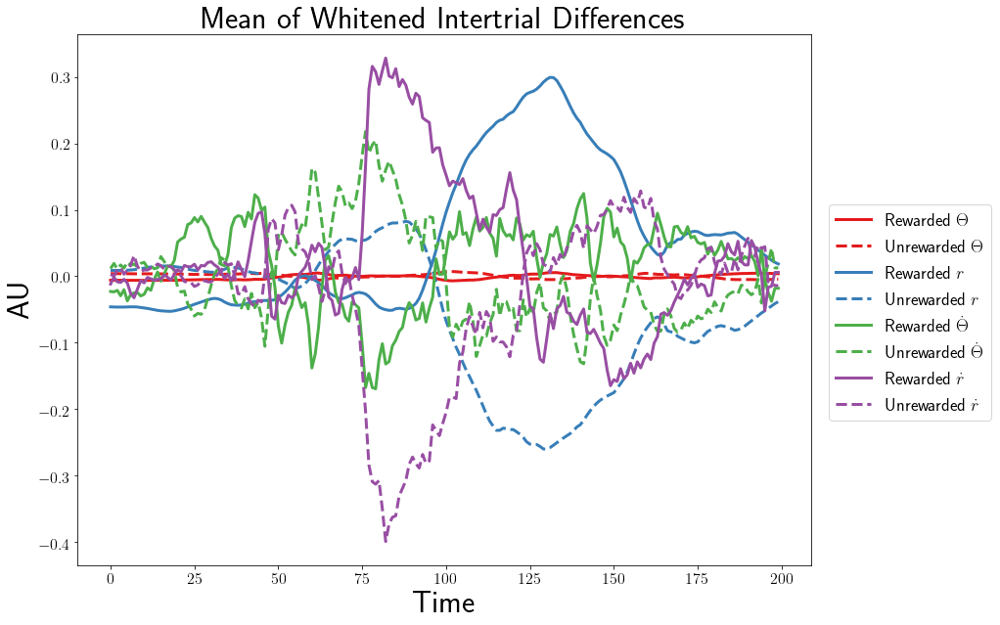

In [354]:
FONTSIZE = 32
from matplotlib import rc
rc('text', usetex=True)
fig, ax = plt.subplots(1,1,figsize=(15,10))
labels = ["$\Theta$","$r$","$\dot{\Theta}$","$\dot{r}$"]
colors = make_color_vector(cm.Set1,10)
for i, (rm, urm) in enumerate(zip(total_whitened_rewarded_means, total_whitened_unrewarded_means)):
    ax.plot(rm,color=colors[i],label="Rewarded "+labels[i])
    ax.plot(urm,"--",color=colors[i],label="Unrewarded "+labels[i])
ax.set_xlabel("Time",fontsize=FONTSIZE)
ax.set_ylabel("AU",fontsize=FONTSIZE)
ax.set_title("Mean of Whitened Intertrial Differences", fontsize=FONTSIZE)
fig.legend(fontsize=18,loc="center right")
plt.subplots_adjust(right=0.82)

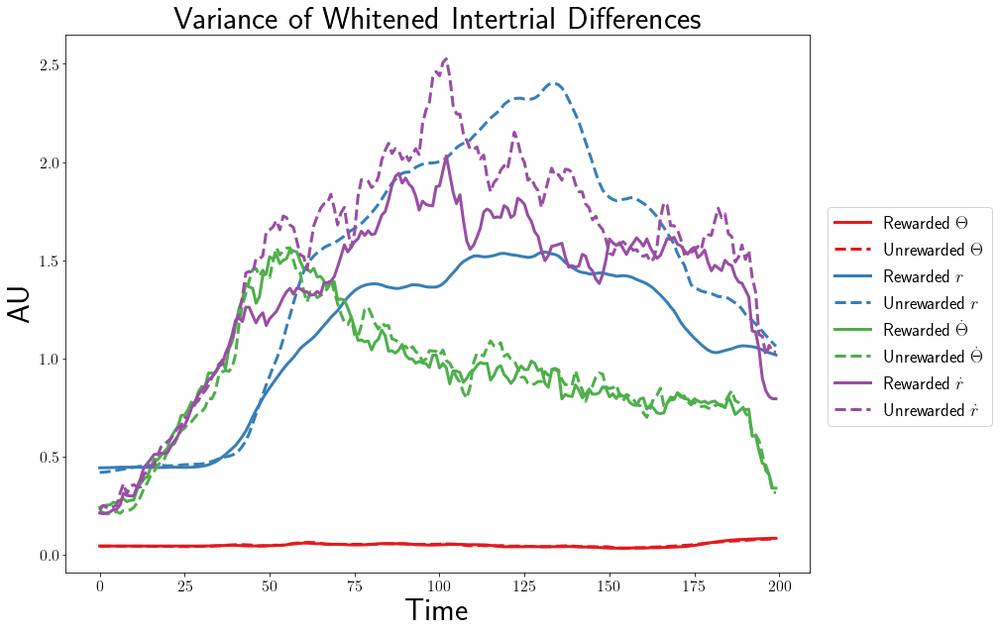

In [355]:
from matplotlib import rc
rc('text', usetex=True)
fig, ax = plt.subplots(1,1,figsize=(15,10))
for i, (rv, urv) in enumerate(zip(total_whitened_rewarded_vars, total_whitened_unrewarded_vars)):
    ax.plot(rv,color=colors[i],label="Rewarded "+labels[i])
    ax.plot(urv,"--",color=colors[i],label="Unrewarded "+labels[i])
ax.set_xlabel("Time",fontsize=FONTSIZE)
ax.set_ylabel("AU",fontsize=FONTSIZE)
ax.set_title("Variance of Whitened Intertrial Differences", fontsize=FONTSIZE)
fig.legend(fontsize=18,loc="center right")
plt.subplots_adjust(right=0.82)

## intertrial difference means over sessions (point whitened)

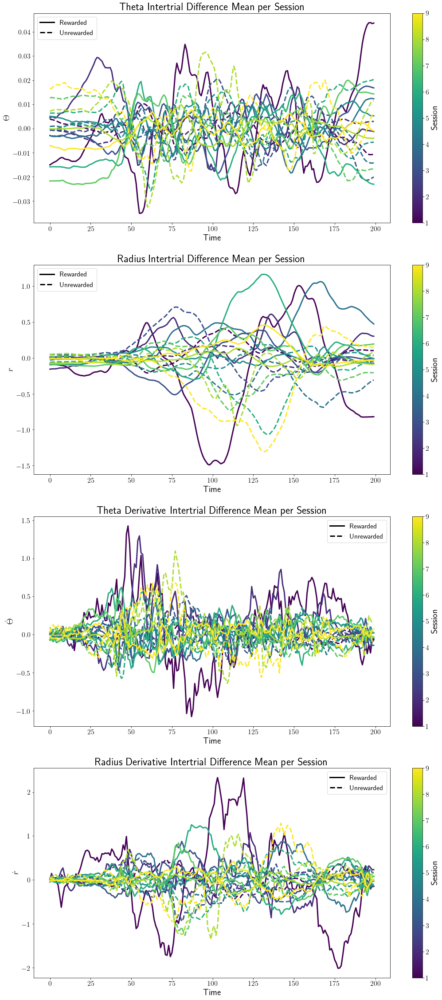

In [356]:
from matplotlib import rc
rc('text', usetex=True)
fig, axes = plt.subplots(4,1,figsize=(18,40))
ylabels = ["$\Theta$","$r$","$\dot{\Theta}$","$\dot{r}$"]
titles = ["Theta Intertrial Difference Mean per Session","Radius Intertrial Difference Mean per Session","Theta Derivative Intertrial Difference Mean per Session","Radius Derivative Intertrial Difference Mean per Session"]
cmap = cm.viridis
colors = make_color_vector(cmap,9)
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(colors))
ax.plot([0,200],[0,0],"--k",alpha=0.3,label="Zero")
first = True
for k, (rm, urm, color) in enumerate(zip(session_whitened_rewarded_difference_means, session_whitened_unrewarded_difference_means,colors)):
    for i, ax in enumerate(axes):
        ax.plot(rm[i],color=color,label=f"Session {k} Rewarded")
        ax.plot(urm[i],"--",color=color,label=f"Session {k} Unrewarded")
        if first:
            ax.set_xlabel("Time")
            ax.set_ylabel(ylabels[i])
            fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax,label="Session")
            h, = ax.plot(0,0,"k")
            g, = ax.plot(0,0,"--k")
            ax.legend([h,g],["Rewarded", "Unrewarded"],fontsize=16)
            ax.set_title(titles[i])
    first = False

## intertrial difference vars over sessions (point whitened)

In [ ]:
from matplotlib import rc
rc('text', usetex=True)
fig, axes = plt.subplots(4,1,figsize=(18,40))
ylabels = ["$\Theta$","$r$","$\dot{\Theta}$","$\dot{r}$"]
titles = ["Theta Intertrial Difference Variance over Sessions","Radius Intertrial Difference Variance over Sessions","Theta Derivative Intertrial Difference Variance over Sessions","Radius Derivative Intertrial Difference Variance over Sessions"]
cmap = cm.viridis
colors = make_color_vector(cmap,9)
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(colors))
first = True
ax.plot([0,200],[0,0],"--k",alpha=0.3,label="Zero")
for k, (rm, urm, color) in enumerate(zip(session_whitened_rewarded_difference_vars, session_whitened_unrewarded_difference_vars,colors)):
    for i, ax in enumerate(axes):
        ax.plot(rm[i],color=color,label=f"Session {k} Rewarded")
        ax.plot(urm[i],"--",color=color,label=f"Session {k} Unrewarded")
        if first:
            ax.set_xlabel("Time")
            ax.set_ylabel(ylabels[i])
            fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax,label="Session")
            h, = ax.plot(0,0,"k")
            g, = ax.plot(0,0,"--k")
            ax.legend([h,g],["Rewarded", "Unrewarded"],fontsize=16)
            ax.set_title(titles[i])
    first = False

## explanation of symmetry in intertrial differences

In [ ]:
trials = combine_sessions(subject_sessions[SUBJECT][1:-1],TARGET)
idx1 = 53
idx2 = 54
idx3 = 55
plt.figure(figsize=(10,10))
plt.polar(trials[idx1].interpolated_trajectory[0],trials[idx1].interpolated_trajectory[1],label="sample 1")
plt.polar(trials[idx2].interpolated_trajectory[0],trials[idx2].interpolated_trajectory[1],label="sample 2")
plt.polar(trials[idx3].interpolated_trajectory[0],trials[idx3].interpolated_trajectory[1],label="sample 3")
plt.legend()

plt.figure(figsize=(14,8))
plt.plot(trials[idx1].interpolated_trajectory[0],label="sample 1")
plt.plot(trials[idx2].interpolated_trajectory[0],label="sample 2")
plt.plot(trials[idx3].interpolated_trajectory[0],label="sample 3")
plt.plot(trials[idx2].interpolated_trajectory[0]-trials[idx1].interpolated_trajectory[0],label="2-1")
plt.plot(trials[idx3].interpolated_trajectory[0]-trials[idx2].interpolated_trajectory[0],label="3-2")
plt.xlabel("Time")
plt.ylabel("Theta")
plt.legend()

plt.figure(figsize=(14,8))
plt.plot(trials[idx1].interpolated_trajectory[1],label="sample 1")
plt.plot(trials[idx2].interpolated_trajectory[1],label="sample 2")
plt.plot(trials[idx3].interpolated_trajectory[1],label="sample 3")
plt.plot(trials[idx2].interpolated_trajectory[1]-trials[idx1].interpolated_trajectory[1],label="2-1")
plt.plot(trials[idx3].interpolated_trajectory[1]-trials[idx2].interpolated_trajectory[1],label="3-2")
plt.xlabel("Time")
plt.ylabel("Radius")
plt.legend()

# trajectory distribution of training trials

In [374]:
sessions = subject_sessions[SUBJECT][1:-1]
print("all curves: ",curve_stack.shape)
successful_curve_matrix = stack_curves(sessions, target=TARGET, reward=True)
print("successful curves: ",successful_curve_matrix.shape)
unsuccessful_curve_matrix = stack_curves(sessions, target=TARGET, reward=False)
print("unsuccessful curves: ",unsuccessful_curve_matrix.shape)

curve_matrices = [stack_curves([session], target=TARGET, reward=None) for session in sessions]
print("block stacks: ",[c.shape for c in curve_matrices])
lens = np.array([s[0] for s in [c.shape for c in curve_matrices]])
block_end_indices = np.cumsum(lens)
print("block end indices: ",block_end_indices)
day_start_indices = [block_end_indices[2], block_end_indices[5]]
print("day start indices: ", day_start_indices)

mean_curve = np.mean(curve_stack, axis=0)
stddev = np.std(curve_stack, axis=0)
print(mean_curve.shape, stddev.shape)

all curves:  (403, 2, 200)
successful curves:  (196, 2, 200)
unsuccessful curves:  (207, 2, 200)
block stacks:  [(45, 2, 200), (45, 2, 200), (45, 2, 200), (44, 2, 200), (45, 2, 200), (44, 2, 200), (45, 2, 200), (45, 2, 200), (45, 2, 200)]
block end indices:  [ 45  90 135 179 224 268 313 358 403]
day start indices:  [135, 268]
(2, 200) (2, 200)


Text(0, 0.5, 'Radius')

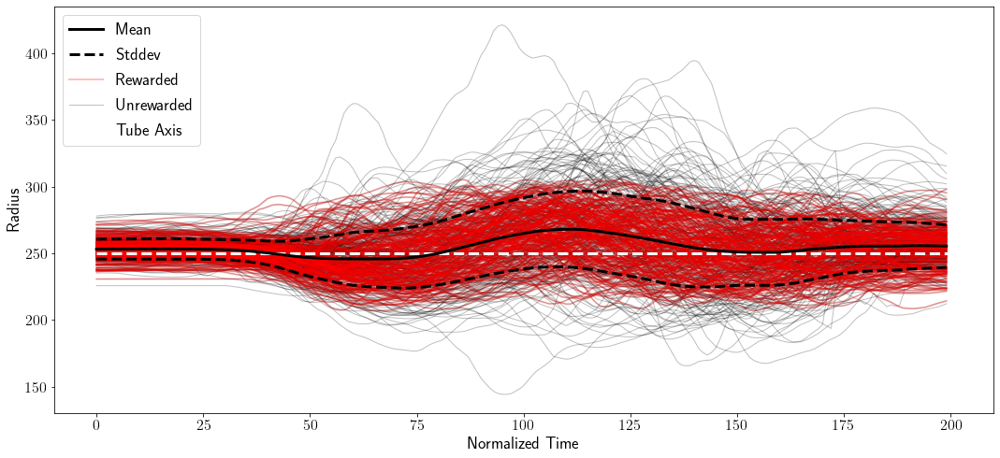

In [375]:
plt.figure(figsize=(18,8))
for c in curve_stack:
    if not np.any(np.abs(c[1]-250) > 200):
        u, = plt.plot(c[1], 'k', alpha=0.25, linewidth=1)
for c in successful_curve_matrix:
    if not np.any(np.abs(c[1]-250) > 200):
        r, = plt.plot(c[1], 'r', alpha=0.25,zorder=100, linewidth=2)
m, = plt.plot(mean_curve[1],color='k',zorder=200)
plt.plot(mean_curve[1]+stddev[1],"--k",zorder=200)
s, = plt.plot(mean_curve[1]-stddev[1],"--k",zorder=200)
d, = plt.plot([0,200],[250,250],'--w',zorder=100)
plt.legend([m,s,r,u,d],["Mean","Stddev","Rewarded","Unrewarded","Tube Axis"],fontsize=18)
plt.xlabel("Normalized Time",fontsize=18)
plt.ylabel("Radius",fontsize=18)

Text(0, 0.5, 'Radius')

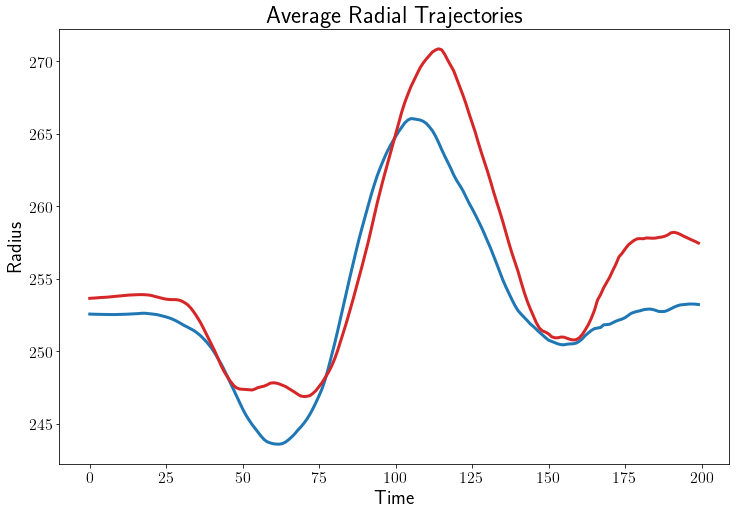

In [379]:
plt.figure(figsize=(12,8))
plt.title("Average Radial Trajectories")
plt.plot(np.mean(successful_curve_matrix[:,1,:],axis=0),color="tab:blue")
plt.plot(np.mean(unsuccessful_curve_matrix[:,1,:],axis=0),color="tab:red")
plt.xlabel("Time")
plt.ylabel("Radius")

## Radial Mahalanobis Distance

$d_{\textrm{Mahalanobis}} = v^T\Sigma^{-1}v$

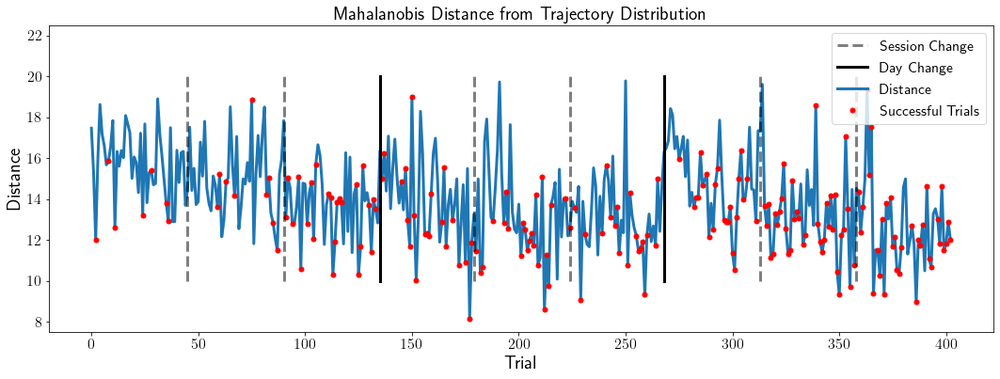

In [383]:
covariance = np.cov(curve_stack[:,1,:].T)
inv_cov = np.linalg.inv(covariance)
np.max(covariance), np.max(inv_cov)
# distance to overall distribution
distances = np.array([mahalanobis(c-mean_curve[1],inv_cov) for c in curve_stack[:,1,:]])
reward = stack_reward(sessions,target=TARGET)
reward_indices = np.arange(len(reward))[reward[:,0]]
plt.figure(figsize=(18,6))
d, = plt.plot(distances)
s, = plt.plot(reward_indices, successful_distances,"or",markersize=5)
for i in block_end_indices[:-1]:
    h, = plt.plot([i,i],[10,20],'--k',alpha=0.5)
for i in day_start_indices:
    dh, = plt.plot([i,i],[10,20],"k")
plt.xlabel("Trial",fontsize=20)
plt.ylabel("Distance",fontsize=20)
plt.title("Mahalanobis Distance from Trajectory Distribution",fontsize=20)
plt.ylim([7.5,22.5])
plt.legend(handles = [h, dh, d, s], labels=["Session Change","Day Change","Distance", "Successful Trials"],fontsize=16)

# intertrial covariance 

If you take the cross-covariance (outer product) between two trials, dot(X_t^T, X_t+1), it’s obviously rank-1. The spectrum has a single eigenvalue. Of course the same goes for the auto-covariance. 

We want to know the **update** between trials to the temporal covariance. 

What is the difference of the covariance between trial $k$ and $k+1$. 

1. Compare intertrial cross-covariances: $K(X_t,X_{t+1})$. How can this flow be visualized? 

2. Compare the intertrial difference between auto-covariances: $K(X_{t+1},X_{t+1}) - K(X_t,X_t)$

3. Track the rank-1 updates to the running sample covariance?
    - $x_k \propto \mathcal{N}(u_k, \Sigma_k)$
    - $\Sigma_{k+1} = \alpha_k\Sigma_k + \beta_k x_kx_k$
    - $\Sigma_{k+1} - \Sigma_k = \beta_k x_kx_k$
    
N-dimensional time series $x_i(t)$

Spatial covariance

$K^{spatial}_{ij} = \Sigma_{t}x_i(t)x_j(t)$

Temporal covariance

$K^{temporal}_{ts} = \Sigma_{i}x_i(t)x_i(s)$

## whiten curves

In [529]:
print(len(sessions))
curve_stack = stack_curves(sessions,TARGET)
print(curve_stack.shape)
whitened_curve_stack = (curve_stack[:,1,:] - np.mean(curve_stack[:,1,:]))/np.std(curve_stack[:,1,:])
print(whitened_curve_stack.shape)

9
(405, 2, 200)
(405, 200)


# Intertrial cross-covariance $y_k = r_{k}r_{k+1}^T$

$$r \in R^T$$

Do rewarded trials $k$ have different cross-covariance than unrewarded trials?

Do cross-covariances trend over trials? (When decomposed using e.g. TCA)

In [530]:
def covariance(u,v):
    return np.outer(u,v.T)/u.shape[0]

rewarded_crosscovs = []
unrewarded_crosscovs = []
for i in range(whitened_curve_stack.shape[0]-1):
    j = i+1
    r1 = whitened_curve_stack[i,:]
    r2 = whitened_curve_stack[j,:]
    R = covariance(r1,r2)
    if all_trials[i].reward == True:
        rewarded_crosscovs.append(R)
    elif all_trials[i].reward == False:
        unrewarded_crosscovs.append(R)

rewarded_crosscovs = np.array(rewarded_crosscovs)
unrewarded_crosscovs = np.array(unrewarded_crosscovs)
print(rewarded_crosscovs.shape, unrewarded_crosscovs.shape)

(186, 200, 200) (218, 200, 200)


Each $R$ is rank-1

Take the mean of each cross-covariance

In [531]:
def make_2D_marginals_plot(matrices, 
                           layout, 
                           marginal_lims, 
                           colorbar_lims, 
                           titles, 
                           labels, 
                           titlesize=35, 
                           labelsize=28):
    num_maingrids = np.prod(matrices.shape[:2])
    assert np.product(layout) == num_maingrids

    main_figure = plt.figure(constrained_layout=False,figsize=(11*layout[1],10*layout[0]))
    main_gridspec = matplotlib.gridspec.GridSpec(layout[0], layout[1], figure=main_figure,
                                                 wspace=0.25, hspace=0.2)

    for i in range(layout[0]):
        for j in range(layout[1]):
            gs = matplotlib.gridspec.GridSpecFromSubplotSpec(2, 
                                                             3, 
                                                             subplot_spec=main_gridspec[i,j],
                                                             width_ratios=(1,5,.25,), height_ratios=(5,1),
                                                             wspace=0.1, hspace=0.1)
            left_ax = main_figure.add_subplot(gs[0, 0])
            main_ax = main_figure.add_subplot(gs[0, 1])
            bottom_ax = main_figure.add_subplot(gs[1, 1])
            cbar_ax = main_figure.add_subplot(gs[0,2])

            matrix = matrices[i,j][::-1]
            lo = marginal_lims[i,j][0]
            hi = marginal_lims[i,j][1]
            vmin = colorbar_lims[i,j][0]
            vmax = colorbar_lims[i,j][1]
            xlabel = labels[i,j][0] 
            ylabel = labels[i,j][1]
            num_left_points = matrix.shape[0]
            num_bottom_points = matrix.shape[1]

            im = main_ax.imshow(matrix, vmin=vmin, vmax=vmax,aspect="auto",cmap=cm.cividis)
            main_figure.colorbar(im, cax=cbar_ax)
            main_ax.set_xticks([])
            main_ax.set_yticks([])
            main_ax.set_title(titles[i,j])

            left_sum = np.sum(matrix,axis=1)
            left_ax.plot(-left_sum[::-1], range(num_left_points))
            left_ax.set_xticks(-np.linspace(lo,hi,3,endpoint=True))
            left_ax.set_xticklabels([round(xt,1) for xt in np.linspace(lo,hi,3)])
            left_ax.set_ylabel(ylabel,fontsize=labelsize)

            bottom_sum = np.sum(matrix,axis=0)
            bottom_ax.plot(bottom_sum)
            bottom_ax.set_ylim([lo,hi])
            bottom_ax.set_xlabel(xlabel,fontsize=labelsize)
        

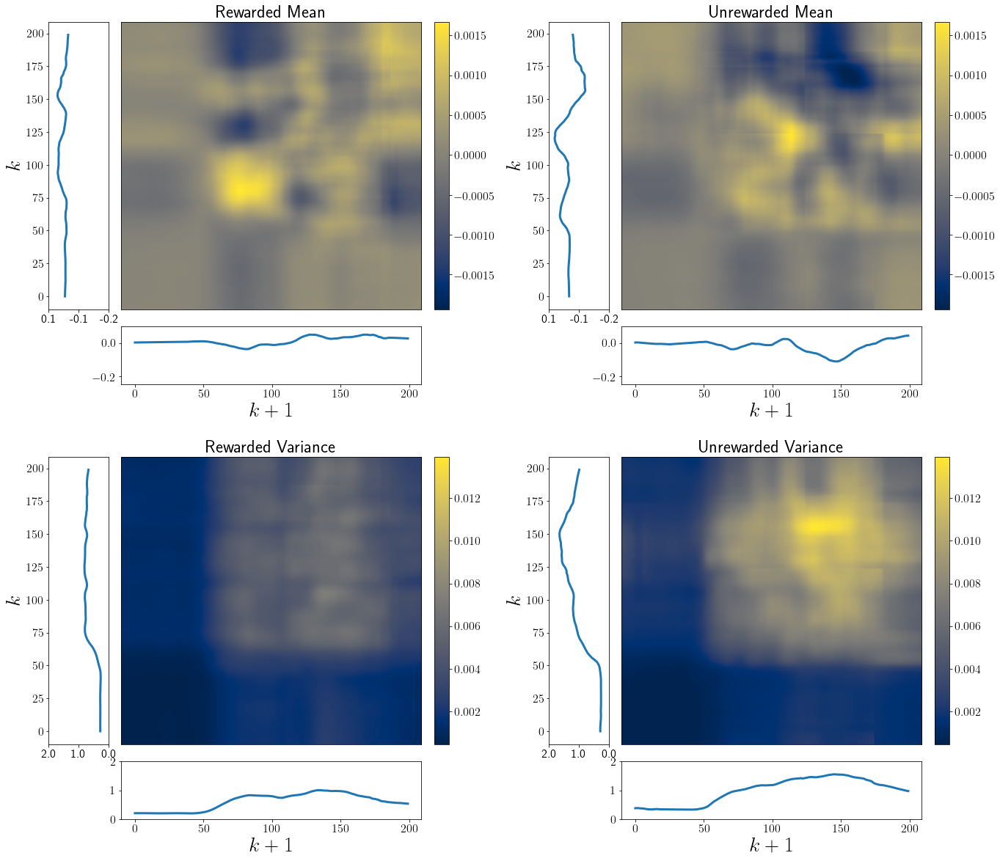

In [532]:
mean_rewarded_crosscovs = np.mean(rewarded_crosscovs,axis=0)
mean_unrewarded_crosscovs = np.mean(unrewarded_crosscovs,axis=0)
std_rewarded_crosscovs = np.std(rewarded_crosscovs,axis=0)
std_unrewarded_crosscovs = np.std(unrewarded_crosscovs,axis=0)

matrices = np.array([mean_rewarded_crosscovs,
           mean_unrewarded_crosscovs,
           std_rewarded_crosscovs,
           std_unrewarded_crosscovs]).reshape(2,2,200,200)

colorbar_lims = np.array([[(np.min([np.min(mean_rewarded_crosscovs),np.min(mean_unrewarded_crosscovs)]),
                  np.max([np.max(mean_rewarded_crosscovs),np.max(mean_unrewarded_crosscovs)])) for i in range(2)],
                [(np.max([np.max(std_rewarded_crosscovs),np.max(std_unrewarded_crosscovs)]),
                  np.min([np.min(std_rewarded_crosscovs),np.min(std_unrewarded_crosscovs)])) for i in range(2)]])

marginal_lims = np.array([[(-0.25,0.1) for i in range(2)], [(0,2) for i in range(2)]])

labels = np.array([("$k+1$","$k$") for i in range(4)]).reshape(2,2,2)
titles = np.array(["Rewarded Mean", "Unrewarded Mean", "Rewarded Variance", "Unrewarded Variance"]).reshape(2,2)
layout = (2,2)
make_2D_marginals_plot(matrices, layout, marginal_lims, colorbar_lims, titles, labels, titlesize=35, labelsize=28)

## correlation coefficients across trials over time

Is there structure in how trials correlate?

$$c_{kk'} = <r(t)_k,r(t)_k'>_T = r_k^Tr_{k'}$$


In [183]:
m = np.mean(curve_stack[:,1,:])
s = np.std(curve_stack[:,1,:])
c = np.zeros((curve_stack.shape[0],curve_stack.shape[0])) 
for i in range(curve_stack.shape[0]):
    for j in range(curve_stack.shape[0]):
        t1 = curve_stack[i][1]
        t2 = curve_stack[j][1]
        m1 = np.mean(t1)
        m2 = np.mean(t2)
        ct1 = (t1-m1)
        ct2 = (t2-m2)
        n1 = np.linalg.norm(ct1)
        n2 = np.linalg.norm(ct2)
        c[i][j] = np.dot(ct1,ct2)/(n1*n2)

() (200,) ()


Text(0, 0.5, 'Trial')

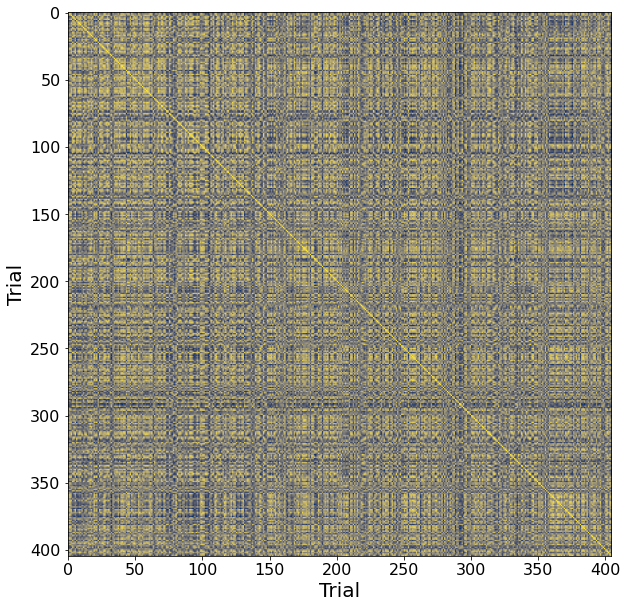

In [187]:
plt.figure(figsize=(10,10))
plt.imshow(c,cmap=cm.cividis,vmin=-1,vmax=1)
plt.xlabel("Trial")
plt.ylabel("Trial")

In [196]:
from sklearn.decomposition import PCA
pca = PCA()
C = pca.fit_transform(c)
M = pca.components_

In [197]:
C.shape,M.shape

((405, 405), (405, 405))

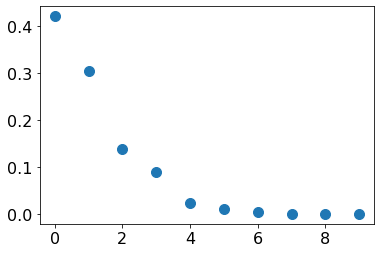

In [206]:
plt.plot(pca.explained_variance_ratio_[:10],'o')

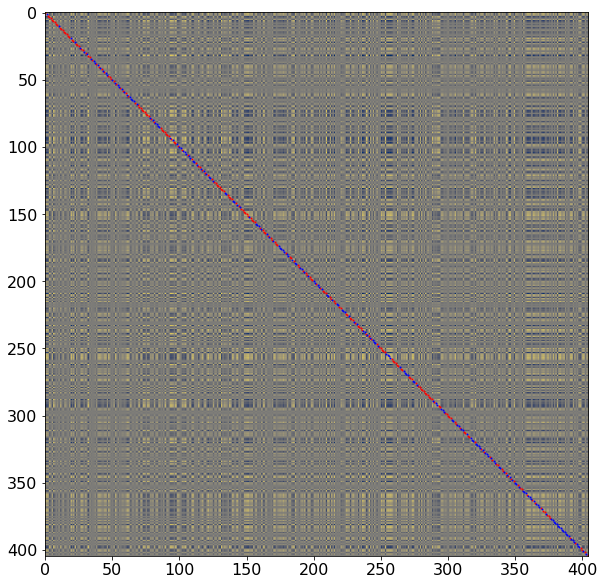

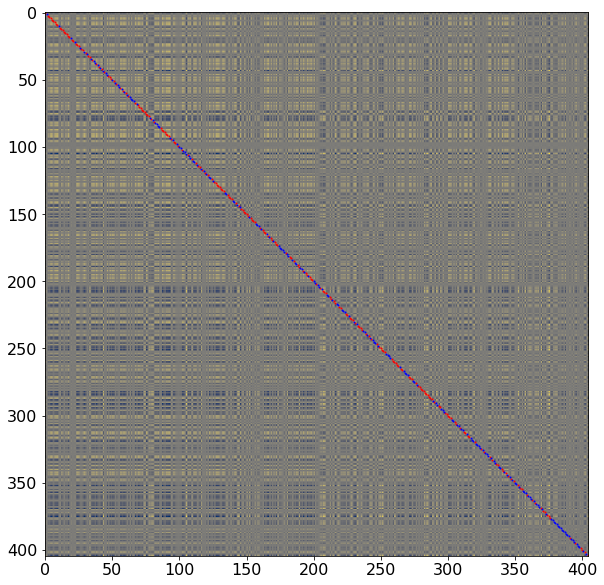

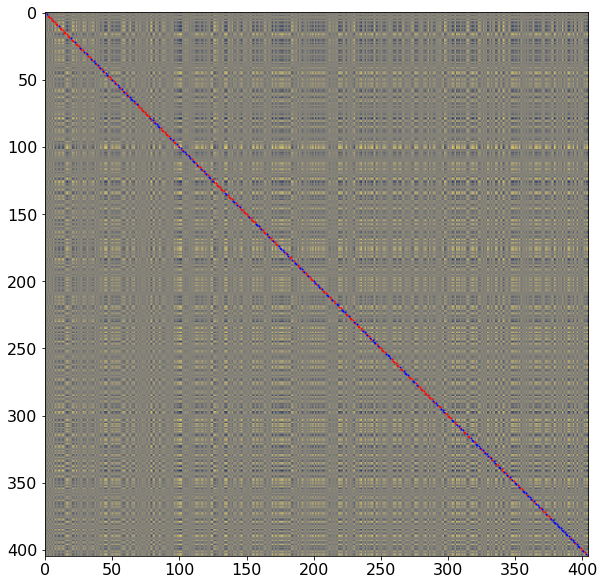

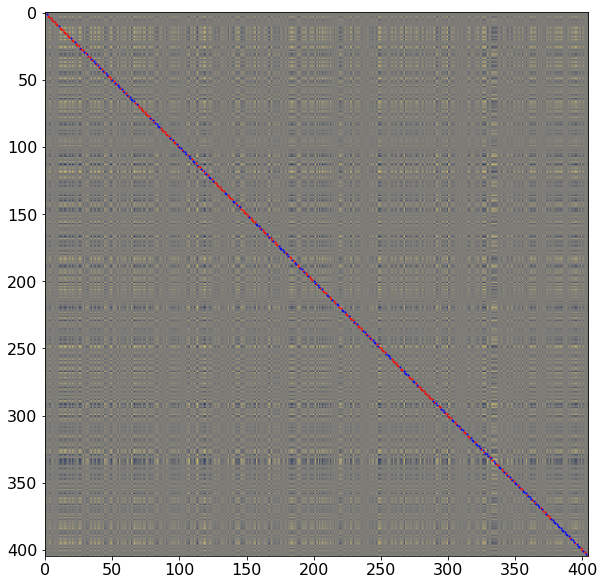

In [213]:
for i in range(4):
    plt.figure(figsize=(10,10))
    plt.imshow(np.outer(C[:,i],M[i,:]),cmap=cm.cividis)
    for i in unrewarded_idx:
        plt.plot(i,i,'ro',markerSize=1)
    for i in rewarded_idx:
        plt.plot(i,i,'bo',markerSize=1)
    

(200,) 252.11285978054204
(200,) 246.50692911245704
(200,) 254.43085525227622
(200,) 257.7827197677509
(200,) 259.1782042418962
(200,) 254.30864128350544
(200,) 236.0580993971554
(200,) 257.835483276675
(200,) 265.72593318046074
(200,) 242.3755344993441


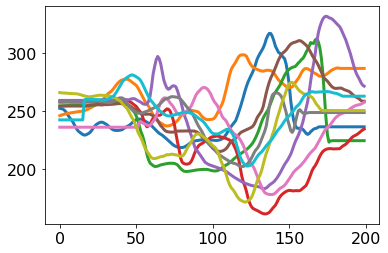

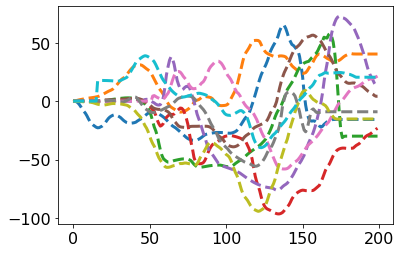

In [137]:
f1,ax1 = plt.subplots()
f2,ax2 = plt.subplots()
for i in range(10):
    t = curve_stack[i][1]
    n = np.linalg.norm(t[1])
    m = np.mean(t[1])
    nt = t - m
    print(nt.shape, m)
    ax1.plot(t)
    ax2.plot(nt,'--')

## intertrial autocovariance difference (gradient?) $y_k = x_{k+1}x_{k+1}^T- x_{k}x_{k}^T$

In [513]:
rewarded_cov_diffs = []
unrewarded_cov_diffs = []
for i, curve in enumerate(whitened_curve_stack[:-1,:]):
    next_curve = whitened_curve_stack[i+1,:]
    acov = covariance(curve,curve)
    next_acov = covariance(next_curve,next_curve)
    D = next_acov-acov
    if all_trials[i].reward == True:
        rewarded_cov_diffs.append(D)
    elif all_trials[i].reward == False:
        unrewarded_cov_diffs.append(D)   
rewarded_cov_diffs = np.stack(rewarded_cov_diffs)
unrewarded_cov_diffs = np.stack(unrewarded_cov_diffs)
print(rewarded_cov_diffs.shape,unrewarded_cov_diffs.shape, rewarded_cov_diffs.shape[0]+unrewarded_cov_diffs.shape[0])

(185, 200, 200) (217, 200, 200) 402


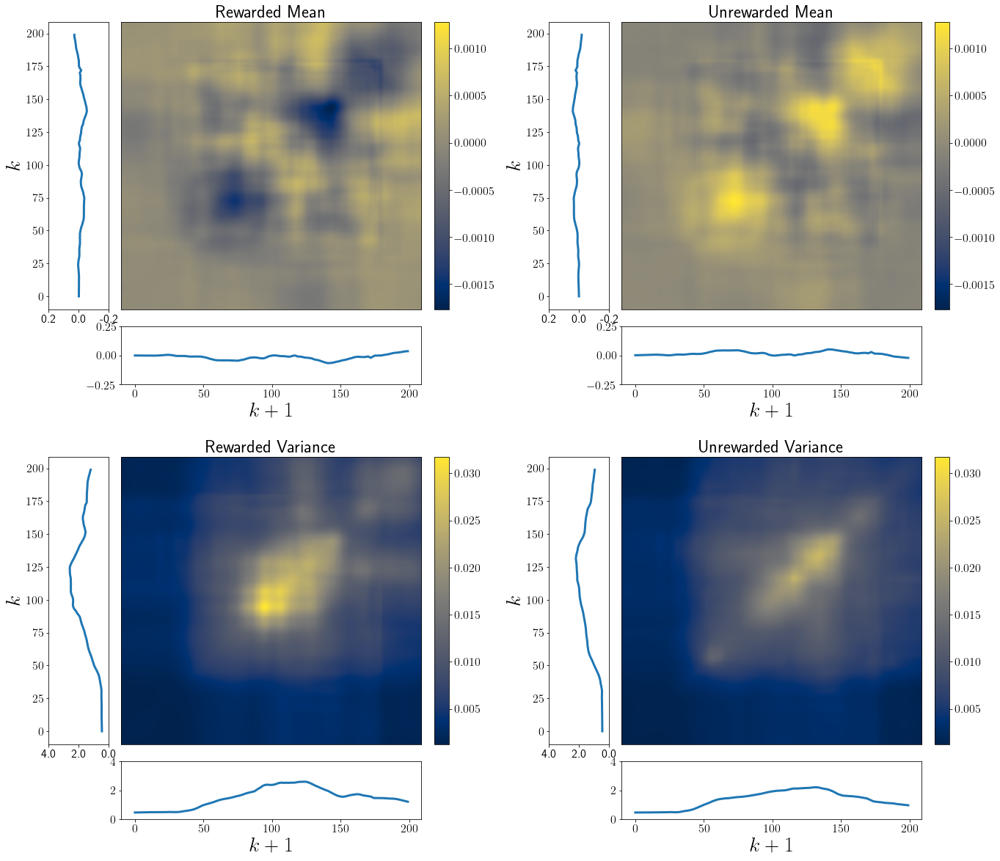

In [514]:
mean_rewarded_cov_diffs = np.mean(rewarded_cov_diffs,axis=0)
mean_unrewarded_cov_diffs = np.mean(unrewarded_cov_diffs,axis=0)
std_rewarded_cov_diffs = np.std(rewarded_cov_diffs,axis=0)
std_unrewarded_cov_diffs = np.std(unrewarded_cov_diffs,axis=0)

matrices = np.array([mean_rewarded_cov_diffs,
           mean_unrewarded_cov_diffs,
           std_rewarded_cov_diffs,
           std_unrewarded_cov_diffs]).reshape(2,2,200,200)

colorbar_lims = np.array([[(np.min([np.min(mean_rewarded_cov_diffs),np.min(mean_unrewarded_cov_diffs)]),
                  np.max([np.max(mean_rewarded_cov_diffs),np.max(mean_unrewarded_cov_diffs)])) for i in range(2)],
                [(np.max([np.max(std_rewarded_cov_diffs),np.max(std_unrewarded_cov_diffs)]),
                  np.min([np.min(std_rewarded_cov_diffs),np.min(std_unrewarded_cov_diffs)])) for i in range(2)]])

marginal_lims = np.array([[(-0.25,0.25) for i in range(2)], [(0,4) for i in range(2)]])

labels = np.array([("$k+1$","$k$") for i in range(4)]).reshape(2,2,2)
titles = np.array(["Rewarded Mean", "Unrewarded Mean", "Rewarded Variance", "Unrewarded Variance"]).reshape(2,2)
layout = (2,2)
make_2D_marginals_plot(matrices, layout, marginal_lims, colorbar_lims, titles, labels, titlesize=35, labelsize=28)

# Sample covariance eigenmodes over all trials

Text(0, 0.5, '\\% Variance')

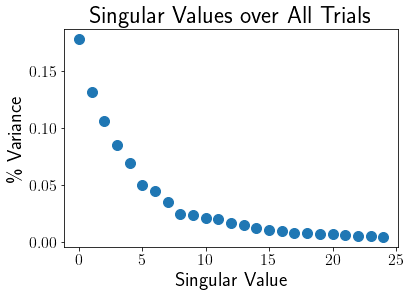

In [390]:
u,s,v = compute_svd(curve_stack[:,1,:])
s = s/np.sum(s)
plt.plot(s[:25],'o')
plt.title("Singular Values over All Trials")
plt.xlabel("Singular Value")
plt.ylabel("\% Variance")

Text(0.5, 0.96, 'Eigenmodes over All Trials')

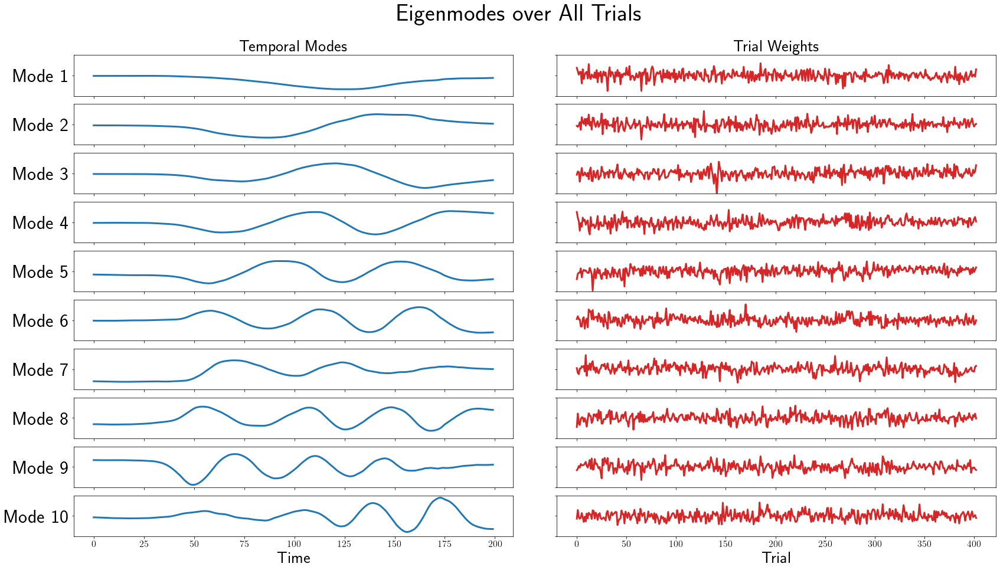

In [391]:
# eigenvectors of AA^T -- variance captured time point over trials 
num_modes = 10
fig, axes = plt.subplots(num_modes,2,figsize=(28,15))
plt.subplots_adjust(wspace=0.1)
for n in range(num_modes):
    axes[n,0].plot(u[:,n])
    axes[n,1].plot(v[n,:],color="tab:red")
    axes[n,0].label_outer()
    axes[n,0].set_ylim([-0.2,0.2])
    axes[n,0].set_yticklabels([])
    axes[n,0].set_yticks([0])
    axes[n,0].set_yticklabels([f"Mode {n+1}"],fontsize=32)
    axes[n,1].set_ylim([-0.25,0.25])
    axes[n,1].label_outer()

axes[0,0].set_title("Temporal Modes",fontsize=28)
axes[0,1].set_title("Trial Weights",fontsize=28)
axes[-1,0].set_xlabel("Time",fontsize=28)
axes[-1,1].set_xlabel("Trial",fontsize=28)
# axes[-1,1].set_xticks(range(0,150,20))
# axes[-1,1].set_xticklabels(list(range(0,150,20)))

fig.suptitle("Eigenmodes over All Trials", y=0.96, fontsize=40)

In [392]:
fig.savefig("modes_over_trials.pdf",dpi=300,bbox_inches="tight")

Text(0.5, 0, 'Trials')

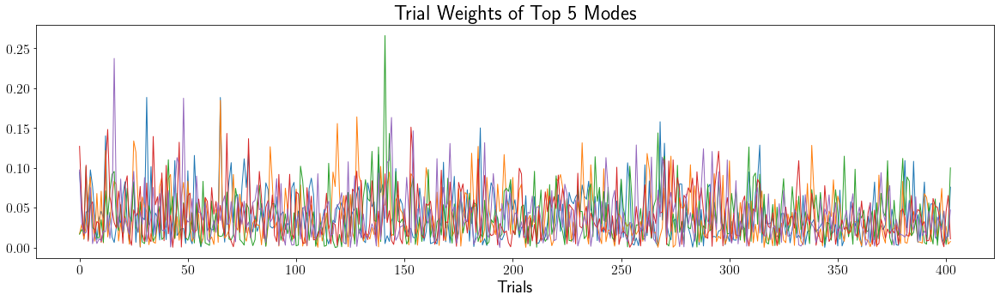

In [393]:
# try rectifying and smoothing the trial weights
def smooth(y, box_pts):
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='same')
    return y_smooth

plt.figure(figsize=(20,5))
trial_weights = v[:5,:]
rectified = np.abs(trial_weights)
for vv in rectified:
    plt.plot(vv,linewidth=1)
plt.title("Trial Weights of Top 5 Modes")
plt.xlabel("Trials")

## project onto 2 PCs, plot reward and time

## PCA separately on rewarded/unrewarded

In [394]:
rewarded_stack = []
unrewarded_stack = []
for r, c in zip(reward_stack, curve_stack):
    if r[0] == True:
        rewarded_stack.append(c[1])
    elif r[0] == False:
        unrewarded_stack.append(c[1])
rewarded_stack = np.array(rewarded_stack)
unrewarded_stack = np.array(unrewarded_stack)  
print(rewarded_stack.shape)
print(unrewarded_stack.shape)

(196, 200)
(207, 200)


In [395]:
ru,rs,rv = compute_svd(rewarded_stack)
rs = rs/np.sum(rs)
print(ru.shape,rs.shape,rv.shape)

uru,urs,urv = compute_svd(unrewarded_stack)
urs = urs/np.sum(urs)

(200, 200) (196,) (196, 196)


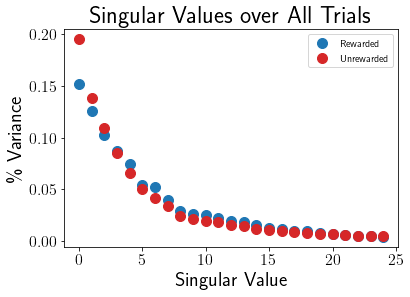

In [396]:
plt.title("Singular Values over All Trials")
plt.xlabel("Singular Value")
plt.ylabel("\% Variance")
plt.plot(rs[:25],'o',color="tab:blue",label="Rewarded")
plt.plot(urs[:25],'o',color="tab:red",label="Unrewarded")
plt.legend()

Text(0.5, 0.96, 'Rewarded and Unrewarded Eigenmodes')

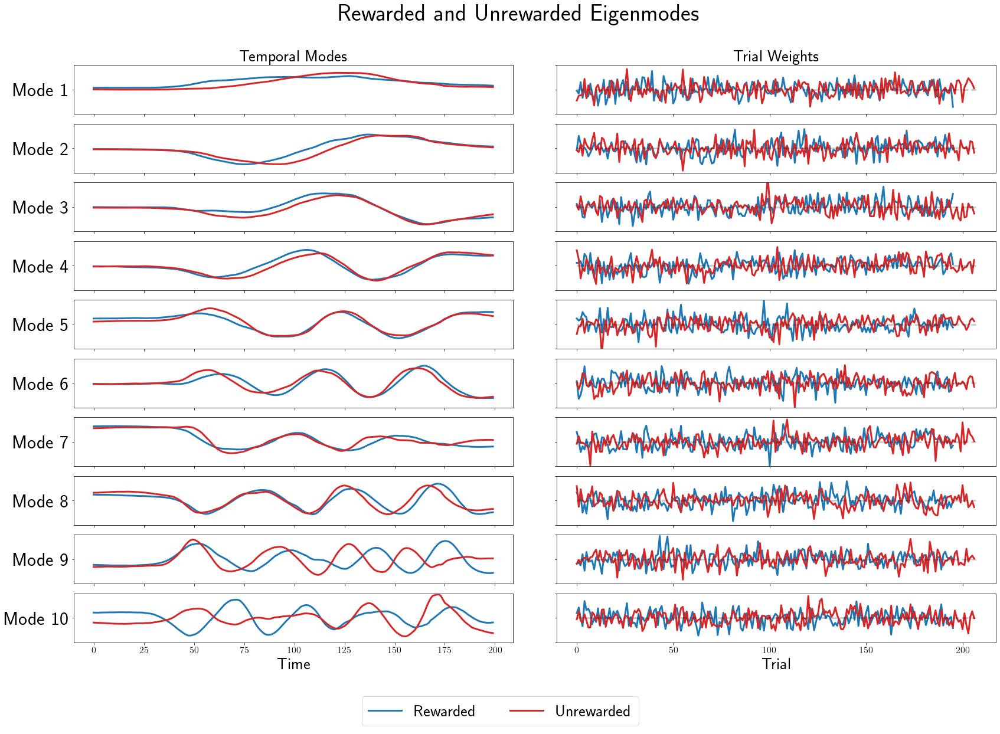

In [515]:
# eigenvectors of AA^T -- variance captured time point over trials 
num_modes = 10
ntrials = urv[0].shape[0]
fig, axes = plt.subplots(num_modes,2,figsize=(28,18))
plt.subplots_adjust(wspace=0.1)
alignment = [-1,-1,-1,1,1,-1,1,1,-1,1]
for i, n in enumerate(range(num_modes)):
    axes[n,0].plot(ru[:,n],color="tab:blue")
    axes[n,1].plot(rv[n,:],color="tab:blue")
    axes[n,0].plot(align_trajectory(uru[:,n],ru[:,n]),color="tab:red")
    axes[n,1].plot(urv[n,:],color="tab:red")
    axes[n,1].plot([0,ntrials],[0,0],"--k",alpha=0.2)
    axes[n,0].label_outer()
    axes[n,0].set_ylim([-0.2,0.2])
    axes[n,0].set_yticklabels([])
    axes[n,0].set_yticks([0])
    axes[n,0].set_yticklabels([f"Mode {n+1}"],fontsize=32)
    axes[n,1].set_ylim([-0.25,0.25])
    axes[n,1].label_outer()
axes[0,0].set_title("Temporal Modes",fontsize=28)
axes[0,1].set_title("Trial Weights",fontsize=28)
axes[-1,0].set_xlabel("Time",fontsize=28)
axes[-1,1].set_xlabel("Trial",fontsize=28)

blueline=matplotlib.lines.Line2D([0], [0], linewidth=3, linestyle="-", color="tab:blue")
redline=matplotlib.lines.Line2D([0], [0], linewidth=3, linestyle="-", color="tab:red")
fig.legend((blueline,redline), ('Rewarded','Unrewarded'), 'lower center',fontsize=28,ncol=2)
fig.suptitle("Rewarded and Unrewarded Eigenmodes", y=0.96, fontsize=40)

# Sample covariance modes over blocks

In [403]:
nmodes = 5
block_stacks = []
for block in block_lists:
    block_stack = []
    for trial in block:
        block_stack.append(trial.warped_polar_trajectory)
    block_stack = np.array(block_stack)[:,1,:]
    block_stacks.append(block_stack)
timemodes = []
trialmodes = []
eigs = []
for stack in block_stacks:
    u,s,v = compute_svd(stack)
    timemodes.append(u[:,:nmodes])
    trialmodes.append(v[:nmodes,:])
    eigs.append(s/np.sum(s))

Text(0.5, 1.0, '\\% Variance of Top 5 Eigenmodes over Blocks')

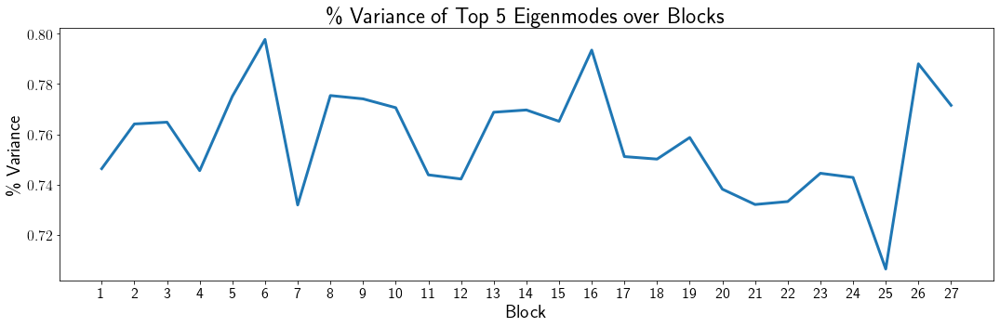

In [404]:
# percent variance of top 5 eigenvectors over blocks
plt.figure(figsize=(18,5))
topNvariance = []
for eigvec in eigs:
    topNvariance.append(np.sum(eigvec[:nmodes]))
x = range(1,28)
plt.plot(x,topNvariance)
l = plt.gca().set_xticks(x)
l = plt.gca().set_xticklabels(x)
plt.ylabel("\% Variance")
plt.xlabel("Block")
plt.title(f"\% Variance of Top {nmodes} Eigenmodes over Blocks")

Text(0.5, 1.0, 'Block')

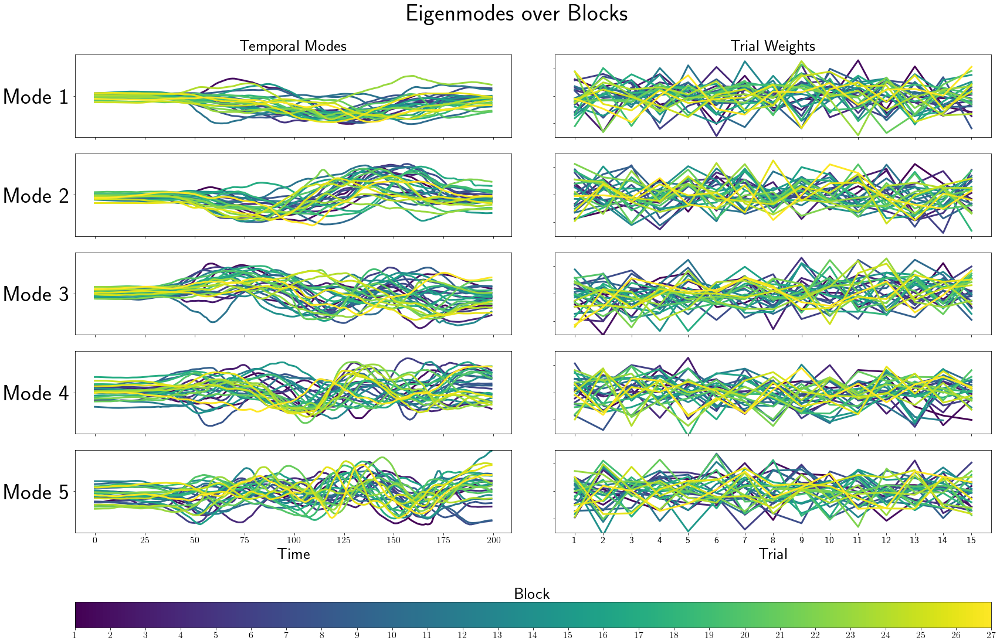

In [419]:
# eigenvectors of AA^T -- variance captured time point over trials 
num_modes = 5
fig, axes = plt.subplots(num_modes,2,figsize=(28,15))
plt.subplots_adjust(wspace=0.1)
colors = make_color_vector(cm.viridis,len(timemodes))
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(colors))
for i, (timevecs, trialvecs) in enumerate(zip(timemodes, trialmodes)):
    for n in range(num_modes):
        axes[n,0].plot(align_trajectory(timevecs[:,n],timemodes[0][:,n]),color=colors[i])
        axes[n,0].label_outer()
        axes[n,0].set_ylim([-0.25,0.25])
        axes[n,0].set_yticks([0])
        axes[n,0].set_yticklabels([f"Mode {n+1}"],fontsize=38)
        axes[n,1].plot(trialvecs[n,:],color=colors[i])
        axes[n,1].set_ylim([-0.75,0.75])
        axes[n,1].label_outer()
axes[-1,1].set_xticklabels(list(range(1,16)))
axes[0,0].set_title("Temporal Modes",fontsize=28)
axes[0,1].set_title("Trial Weights",fontsize=28)
axes[-1,0].set_xlabel("Time",fontsize=28)
axes[-1,1].set_xlabel("Trial",fontsize=28)
axes[-1,1].set_xticks(range(0,15))

fig.suptitle("Eigenmodes over Blocks", y=0.96, fontsize=40)
cbax = fig.add_axes([axes[0,0].get_position().x0,axes[-1,0].get_position().y0-0.15, axes[-1,1].get_position().x1-axes[-1,0].get_position().x0, 0.04])
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbax, ticks=list(range(1,len(block_lists)+1)), orientation="horizontal")
cbax.set_title("Block", fontsize=28,pad=0.5)

In [ ]:
fig.savefig("modes_over_blocks.pdf",dpi=300,bbox_inches="tight")

## ICA

In [535]:
from sklearn.decomposition import FastICA
nc = 5

r_transformer = FastICA(n_components=nc,random_state=0)
print(rewarded_stack.shape)
r_fit = r_transformer.fit(rewarded_stack)
r_source_activities = np.dot(r_fit.components_,rewarded_stack.T)
print(r_fit.mixing_.T.shape, 
      r_fit._unmixing.shape, 
      r_fit.components_.shape, 
      r_fit.whitening_.shape,
      r_source_activities.shape)

(196, 200)
(5, 200) (5, 5) (5, 200) (5, 200) (5, 196)


In [536]:
ur_transformer = FastICA(n_components=nc,random_state=0)
print(unrewarded_stack.shape)
ur_fit = ur_transformer.fit(unrewarded_stack)
ur_source_activities = np.dot(ur_fit.components_,unrewarded_stack.T)
print(ur_fit.mixing_.T.shape, 
      ur_fit._unmixing.shape, 
      ur_fit.components_.shape, 
      ur_fit.whitening_.shape,
      ur_source_activities.shape)

(207, 200)
(5, 200) (5, 5) (5, 200) (5, 200) (5, 207)


/Users/spencerw/miniconda3/envs/data/lib/python3.8/site-packages/sklearn/decomposition/_fastica.py:117: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn('FastICA did not converge. Consider increasing '


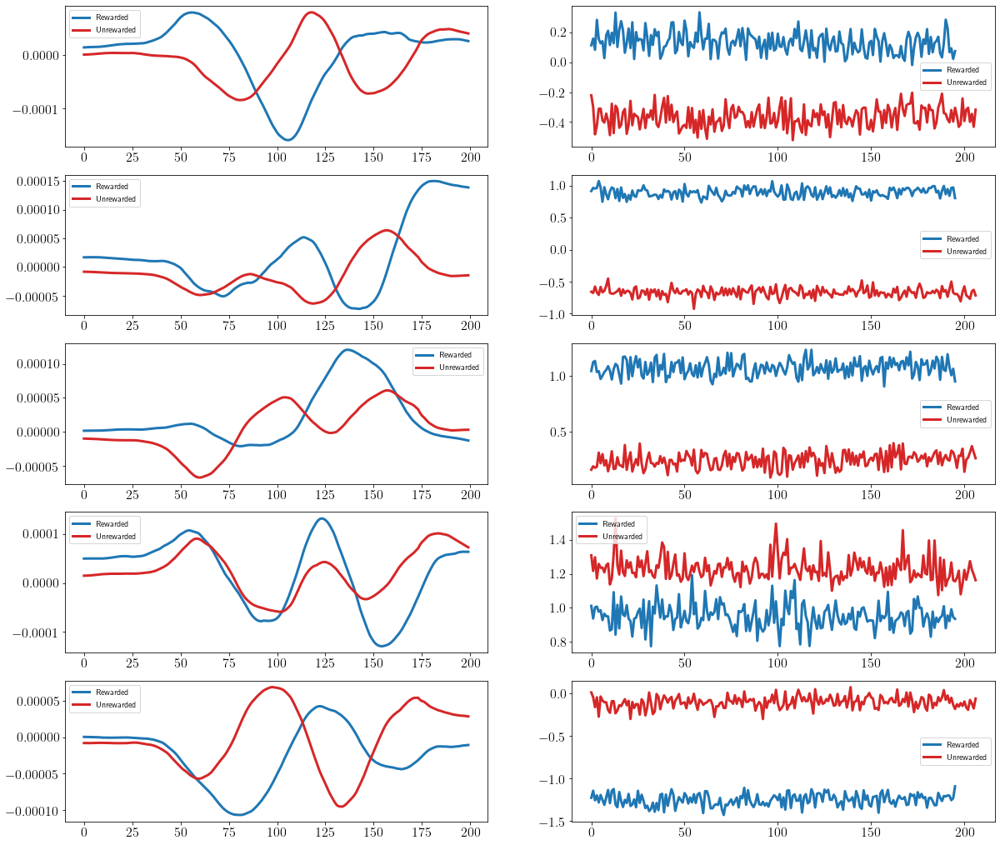

In [538]:
fig, axes = plt.subplots(nc,2,figsize=(20,18))
for i in range(nc):
    axes[i,0].plot(r_fit.components_[i],color="tab:blue",label="Rewarded")
    axes[i,0].plot(ur_fit.components_[i],color="tab:red",label="Unrewarded")
    axes[i,1].plot(r_source_activities[i],color="tab:blue",label="Rewarded")
    axes[i,1].plot(ur_source_activities[i],color="tab:red",label="Unrewarded")
    axes[i,0].legend()
    axes[i,1].legend()

## dPCA

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(unrewarded_stack.mean(axis=0) - unrewarded_stack.mean(),color="tab:red",label="Unrewarded")
plt.plot(rewarded_stack.mean(axis=0) - rewarded_stack.mean(),color="tab:blue",label="Rewarded")
plt.legend()
plt.xlabel("Time")
plt.ylabel("Radius")

In [ ]:
## demixed PCA based on reward

# "neurons", time, reward condition, trial 
# N, S, T
X = np.stack([rewarded_stack.T,unrewarded_stack[:rewarded_stack.shape[0]].T])
print(X.shape)
X = X.T
print(X.shape)
Xm = X.mean()
print(Xm)
# X -= Xm
print(X.shape)

Doesn't make a lot of sense to me to use dPCA, as there's no real alignment between conditions.

Assuming we have an equal number of rewarded and unrewarded trials, we're marginalizing over the reward condition to find (M x T) marginalizations where we're averaging trials over rewarded and unrewarded, which doesn't make much sense, as these trials aren't observations of the same underlying "neuron". 

We want to demix the influence of a rewarded outcome from the temporal dynamics of the movement, to ask what features of reward are present and how do those features that pertain to reward evolve over trials. 

We want something that demixes temporal dynamics from reward to reconstruct single trials, much like our PCA over rewarded and unrewarded trials attempts to do. 

trial = (sum of temporal dynamic modes * temporal trial weights) + (reward-dependent dynamic * reward weight)

we don't want to marginalize over reward by pairing individual rewarded and unrewarded trials... maybe we can insert blank trials and correct for the amount of empty trials? 

In [ ]:
from dPCA import dPCA

"""

"""

dpca = dPCA.dPCA(labels='tr',regularizer=2)
dpca.protect = ['t']
Zfit = dpca.fit(X)
Z = dpca.fit_transform(X)
# print(Zfit.D['t'].T.shape, Zfit.P['t'].shape)

In [ ]:
Xmargs = dpca._marginalize(X)

In [ ]:
x = np.random.random(size=(10,10))
x = np.mean(x,axis=0)
x = np.expand_dims(x,0)
x = np.mean(x,axis=1)
x = np.expand_dims(x,1)
x, x.shape

In [ ]:
print(Xmargs['t'].shape)
# for i in range(10):
x1 = np.arange(0,200,2)
x2 = x1+1
plt.plot(Xmargs['t'][i,x1])
plt.plot(Xmargs['t'][i,x2])

In [ ]:
x1 = np.ones(10)
x2 = x*2 
x3 = x*3 
x4 = x*4 
z1 = np.stack([x1,x2])
z2 = np.stack([x3,x4])
z = np.stack([z1,z2])
print(z)
z = z.reshape((z.shape[0],-1))
z.shape
print(z)

In [ ]:
time = np.arange(200)
colors=make_color_vector(cm.viridis,10)
dashed="--"
solid="-"
nc=5
fig,axes = plt.subplots(nc,3,figsize=(20,20))
time_ax = axes[:,0]
reward_ax = axes[:,1]
mixed_ax = axes[:,2]
for i in range(nc):
    rewarded_time_component = Z['t'][i,:,0]
    rewarded_reward_component = Z['r'][i,:,0]
    rewarded_mixed_component = Z['tr'][i,:,0]
    unrewarded_time_component = Z['t'][i,:,1]
    unrewarded_reward_component = Z['r'][i,:,1]
    unrewarded_mixed_component = Z['tr'][i,:,1]
    time_ax[i].plot(rewarded_time_component,linestyle=solid,color=colors[i])
    reward_ax[i].plot(rewarded_reward_component,linestyle=solid,color=colors[i])
    mixed_ax[i].plot(rewarded_mixed_component,linestyle=solid,color=colors[i])
    time_ax[i].plot(unrewarded_time_component,linestyle=dashed,color=colors[i])
    reward_ax[i].plot(unrewarded_reward_component,linestyle=dashed,color=colors[i])
    mixed_ax[i].plot(unrewarded_mixed_component,linestyle=dashed,color=colors[i])
time_ax[0].set_title("Time Modes")
reward_ax[0].set_title("Reward Modes")
mixed_ax[0].set_title("Time+Reward Modes")

fig, axes = plt.subplots(nc,3,figsize=(20,20))
for i in range(nc):    
    axes[i,0].plot(Zfit.D['t'][:,i])
    axes[i,1].plot(Zfit.D['r'][:,i])
    axes[i,2].plot(Zfit.D['tr'][:,i])
axes[0,0].set_title("Time Mode Trial Weights")
axes[0,1].set_title("Reward Mode Trial Weights")
axes[0,2].set_title("Mixed Mode Trial Weights")

## UMAP projection

In [ ]:
import umap

# UMAP(min_dist=0.5, 
#      n_neighbors=5, 
#      a=None, 
#      angular_rp_forest=False, 
#      b=None,
#      force_approximation_algorithm=False, 
#      init='spectral', 
#      learning_rate=1.0,
#      local_connectivity=1.0, 
#      low_memory=False, 
#      metric='euclidean',
#      metric_kwds=None, 
#      n_components=2, 
#      n_epochs=None,
#      negative_sample_rate=5, 
#      output_metric='euclidean',
#      output_metric_kwds=None, 
#      random_state=42, 
#      repulsion_strength=1.0,
#      set_op_mix_ratio=1.0, 
#      spread=1.0, 
#      target_metric='categorical',
#      target_metric_kwds=None, 
#      target_n_neighbors=-1, 
#      target_weight=0.5,
#      transform_queue_size=4.0, 
#      transform_seed=42, 
#      unique=False, 
#      verbose=False)

reducer = umap.UMAP(min_dist=.1, n_neighbors=15)
X = curve_stack[:,1,:]
print(X.shape)

embedding = reducer.fit_transform(X)
print(embedding.shape)

plt.scatter(
    embedding[:, 0],
    embedding[:, 1],color=make_color_vector(cm.viridis,embedding.shape[0]))

plt.gca().set_aspect('equal', 'datalim')

In [ ]:
from sklearn.manifold import TSNE 

embedding = TSNE(n_components=2,perplexity=100).fit_transform(X)
print(embedding.shape)

plt.scatter(
    embedding[:, 0],
    embedding[:, 1],color=make_color_vector(cm.viridis,embedding.shape[0]))

## tensor decomp

In [ ]:
import tensortools as tt

# ensemble attrs
#  'factors',
#  'fit',
#  'objectives',
#  'results',
#  'similarities'

max_rank = 9
# Fit ensembles of tensor decompositions.
method = "cp_als"    # fits unconstrained tensor decomposition.
ensemble = tt.Ensemble(fit_method=method, fit_options=dict(tol=1e-4))
ensemble.fit(cov_diffs, ranks=range(1, max_rank+1), replicates=1)

In [ ]:
# Plot similarity and error plots.
plt.figure()
# tt.plot_objective(ensemble)
plt.plot([ensemble.objectives(i) for i in range(1,max_rank)])
plt.plot([ensemble.objectives(i) for i in range(1,max_rank)],'bo')
plt.legend()

plt.figure()
# tt.plot_similarity(ensemble)
plt.plot([ensemble.similarities(i) for i in range(1,max_rank)])
plt.plot([ensemble.similarities(i) for i in range(1,max_rank)],'bo')
plt.legend()

In [ ]:
# Align the two fits and print a similarity score.
sim = tt.kruskal_align(U_factors, V_factors, permute_U=True, permute_V=True)
print(sim)

In [ ]:
# Plot the results again to see alignment.
U = ensemble.factors(3)[0]
print(U.rank,U.ndim)

for i, f in enumerate(U):
    print(i, f.shape)

In [ ]:
fig, axes = plt.subplots(U.rank,U.ndim,figsize=(25,15))
fig, ax, po = tt.plot_factors(U, plots=["bar","line","line"],fig=fig)
# tt.plot_factors(V_factors, fig=fig)
# fig.suptitle("aligned models")
fig.tight_layout()

# OLD 

***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
---

## demixed PCA based on reward

In [ ]:
# "neuron", time, trial, reward 
# N, T, M, R -- 
X = np.stack([rewarded_stack,unrewarded_stack[:rewarded_stack.shape[0]]])
print(X.shape)
X = np.swapaxes(X,0,1)
print(X.shape)
X -= np.mean(X.reshape((196,-1)),axis=1)[:,None,None]
print(X.shape)

In [ ]:
from dPCA import dPCA

"""
Doesn't make a lot of sense to me to use dPCA, as there's no real alignment between conditions.
We only have 1 "neuron" here, so a population vector over trials can't really be demixed.
We don't have data for the same neuron under two different conditions, only one neuron over
a range of conditions? Neuron is the trajectory, conditions are trials
"""

dpca = dPCA.dPCA(labels='rt',regularizer=2,n_components=10)
dpca.protect = ['t']
Z = dpca.fit_transform(X)

print(Z.keys())
print(Z['t'].shape)

In [ ]:
time = np.arange(200)
nc = 10
colors=make_color_vector(cm.viridis,nc)
dashed="--"
solid="-"
num_trial_components=10
fig,axes = plt.subplots(3,1,figsize=(20,20))
time_ax = axes[0]
reward_ax = axes[1]
mixed_ax = axes[2]
for i in range(nc):
    rewarded_time_component = Z['t'][i,0]
    rewarded_reward_component = Z['r'][i,0]
    rewarded_mixed_component = Z['rt'][i,0]
    unrewarded_time_component = Z['t'][i,1]
    unrewarded_reward_component = Z['r'][i,1]
    unrewarded_mixed_component = Z['rt'][i,1]
    time_ax.plot(rewarded_time_component,linestyle=solid,color=colors[i])
    reward_ax.plot(rewarded_trial_component,linestyle=solid,color=colors[i])
    mixed_ax.plot(rewarded_mixed_component,linestyle=solid,color=colors[i])
    time_ax.plot(unrewarded_time_component,linestyle=dashed,color=colors[i])
    reward_ax.plot(unrewarded_trial_component,linestyle=dashed,color=colors[i])
    mixed_ax.plot(unrewarded_mixed_component,linestyle=dashed,color=colors[i])

# autocorrelation

In [ ]:
print(session.name)
curves = stack_curves(subject_sessions[SUBJECT][1:-1], target=TARGET)
print(curves.shape)
l = curves.shape[0]
npts = curves.shape[1]

fig = plt.figure(figsize=(8,6))
spec = matplotlib.gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[20, 1])
corrax = fig.add_subplot(spec[0])
cbax = fig.add_subplot(spec[1])
cmap = cm.get_cmap('plasma')
norm = matplotlib.colors.Normalize(vmin=1, vmax=len(curves))
cb = matplotlib.colorbar.ColorbarBase(cbax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')
cb.set_label('trial')


autocorrs = []
for i, c in enumerate(curves):
    r = (c[1] - np.mean(c[1]))/np.std(c[1])
    result = np.correlate(r, r, mode='full')
    autocorr = result[-r.size:]/len(r)
    corrax.plot(autocorr[:100], color=cmap((i)/l),alpha=.1)
    autocorrs.append(autocorr)

corrax.set_title("Autocorrelation")
corrax.set_xlabel("Lag")
corrax.set_ylabel("Correlation")

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(np.array(autocorrs)[:,:100])
plt.title("Autocorrelation")
plt.xlabel("Time")
plt.ylabel("Trials")

## z-score difference relative to trajectory distribution

In [ ]:
Trial.trajectory_zscore = property(None)
all_trials = combine_sessions(sessions,TARGET)
trajectory_distribution_std = np.std(curve_matrix, axis=0)

# # compute z scores of all trials
# for trial in all_trials:
#     trial.trajectory_zscore = (trial.interpolated_trajectory - mean_curve)/trajectory_distribution_std    

# # zscore differences
# Trial.whitened_trajectory_difference = property(None)
# Trial.whitened_derivative_difference = property(None)

# # only take differences within blocks
# for trials in block_lists:
#     for i, current_trial in enumerate(trials[:-1]):
#         next_trial = trials[i+1]
#         next_trial.whitened_trajectory_difference = next_trial.whitened_trajectory - current_trial.whitened_trajectory
#         next_trial.whitened_derivative_difference = next_trial.whitened_derivative - current_trial.whitened_derivative

# plt.figure()
# for urd in unrewarded_differences:
#     plt.plot(urd,'r',alpha=0.01)
# for rd in rewarded_differences:
#     plt.plot(rd,'b',alpha=0.01)
# plt.plot(np.mean(rewarded_differences,axis=0),'b')
# plt.plot(np.mean(rewarded_differences,axis=0)+np.std(rewarded_differences,axis=0),'--b')
# plt.plot(np.mean(rewarded_differences,axis=0)-np.std(rewarded_differences,axis=0),'--b')

# plt.plot(np.mean(unrewarded_differences,axis=0),'r')
# plt.plot(np.mean(unrewarded_differences,axis=0)+np.std(unrewarded_differences,axis=0),'--r')
# plt.plot(np.mean(unrewarded_differences,axis=0)-np.std(unrewarded_differences,axis=0),'--r')

# i = 0 
# for rd in differences:
#     if i == 0:
#         plt.plot(rd,'k',alpha=0.1)
#         i = 1
#     else:
#         plt.plot(rd,'--k',alpha=0.1)
#         i = 0

# plt.figure(figsize=(10,8))
# z_rewarded = []
# z_unrewarded = []

# # notice indices-- current trial z score, previous trial reward
# for zd, r in zip(z_scores,z_score_rewards):
# #     if not np.any(zd>50): 
#     if r:
#         z_rewarded.append(zd)
#         plt.plot(zd,'b',alpha=0.05)
#     else:
#         z_unrewarded.append(zd)
#         plt.plot(zd,'r',alpha=0.05)
# plt.plot(np.mean(z_rewarded,axis=0),'b',label="last trial rewarded mean")
# plt.plot(np.std(z_rewarded,axis=0) + np.mean(z_rewarded,axis=0),'--b',label="last trial rewarded var")

# plt.plot(np.mean(z_unrewarded,axis=0),'r',label="last trial unrewarded mean")
# plt.plot(np.std(z_unrewarded,axis=0) + np.mean(z_unrewarded,axis=0),'--r',label="last trial unrewarded var")

# plt.plot([0,200],[0,0],"--k")

# plt.legend()
# plt.xlabel("Normalized Time")

# plt.ylabel("Z-score of Current Trial")

## AR(1)

In [ ]:
stacked_reward = stack_reward(sessions, event_type, event_target)
rewarded_distances = np.array([distances[i] for i in range(stacked_reward.shape[0]-1) if stacked_reward[i][0]])
rewarded_next_distances = np.array([distances[i] for i in range(1,stacked_reward.shape[0]) if stacked_reward[i][0]])

from sklearn.linear_model import LinearRegression

x = distances[:-1].reshape(-1,1)
y = distances[1:].reshape(-1,1)

plt.figure(figsize=(10,10))
plt.plot(x,y,'k.',alpha=0.2)
plt.xlabel("Trial $k$",fontsize=20)
plt.ylabel("Trial $k+1$",fontsize=20)

model = LinearRegression()
model.fit(x, y)
r_sq = model.score(x, y)
print('coefficient of determination:', r_sq)
print('slope:', model.coef_[0][0])
print('intercept:', model.intercept_[0])
X = np.linspace(np.min(x),np.max(x),100).reshape(-1,1)
y_pred = model.predict(X)
plt.plot(X,y_pred,'-.k')


x = rewarded_distances[:-1].reshape(-1,1)
y = rewarded_next_distances[1:].reshape(-1,1)
plt.plot(x,y,'b.')
model = LinearRegression()
model.fit(x, y)
r_sq = model.score(x, y)
print('coefficient of determination:', r_sq)
print('slope:', model.coef_[0][0])
print('intercept:', model.intercept_[0])
X = np.linspace(np.min(x),np.max(x),100).reshape(-1,1)
y_pred = model.predict(X)
plt.plot(X,y_pred,'--b')

# Gaussian Process Regression

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C

np.random.seed(1)

In [ ]:
# some samples to fit
successful_indices = []
test_session = subject_sessions[0][0]
for i in range(1,82):
    time_limits = test_session.movement_time_limits[i]
    ev = test_session.event_types[i]
    if time_limits[0] == 586 and ev == "training":
        print(test_session.movement_time_limits[i], test_session.in_time_limit[i], test_session.event_types[i],  )
        if test_session.in_time_limit[i][0]:
            successful_indices.append(i)
            plt.plot(test_session.aligned_trajectories[i][0],test_session.aligned_trajectories[i][1], 'b', alpha=0.4)
        else:
            plt.plot(test_session.aligned_trajectories[i][0],test_session.aligned_trajectories[i][1], 'r', alpha=0.4)

plt.gca().set_axis_off()

In [ ]:
y = (test_session.rcurves[successful_indices[0]][1].reshape(-1) - 250) / 250
X = np.linspace(0,1,sample[1].shape[0]).reshape(-1,1)

print(X.shape, y.shape)

# Mesh the input space for evaluations of the real function, the prediction and
# its MSE
x = np.atleast_2d(np.linspace(0, 1, 1000)).T
print(x.shape)

# Instantiate a Gaussian Process model
kernel = RBF(.1)
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=9)

# Fit to data using Maximum Likelihood Estimation of the parameters
gp.fit(X, y)

# Make the prediction on the meshed x-axis (ask for MSE as well)
y_pred, sigma = gp.predict(x, return_std=True)

# Plot the function, the prediction and the 95% confidence interval based on
# the MSE
plt.figure()
plt.plot(X, y, 'r.', markersize=10, label='Observations')
plt.plot(x, y_pred, 'b-', label='Prediction')
plt.fill(np.concatenate([x, x[::-1]]),
         np.concatenate([y_pred - 1.9600 * sigma,
                        (y_pred + 1.9600 * sigma)[::-1]]),
         alpha=.5, fc='b', ec='None', label='95% confidence interval')

In [ ]:
# combine samples into one 
num_trajs = 12
y = (np.hstack([test_session.rcurves[i][1] for i in successful_indices[:num_trajs]]).reshape(-1) - 250) / 250
# y = (test_session.rcurves[successful_indices[0]][1].reshape(-1) - 250) / 250
xx = np.linspace(0,1,200).reshape(-1,1)
X = np.vstack([xx for _ in range(num_trajs)])

print(X.shape, y.shape)

plt.plot(X,y,'.')

In [ ]:
kernel = RBF(10)
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=9)

x = np.atleast_2d(np.linspace(0, 1, 200)).T

# Instantiate a Gaussian Process model

# Fit to data using Maximum Likelihood Estimation of the parameters
gp.fit(X, y)

# Make the prediction on the meshed x-axis (ask for MSE as well)
y_pred, sigma = gp.predict(x, return_std=True)

# Plot the function, the prediction and the 95% confidence interval based on
# the MSE
plt.figure()
plt.plot(X, y, 'r.', markersize=1, label='Observations')
plt.plot(x, y_pred, 'b-', label='Prediction')
plt.fill(np.concatenate([x, x[::-1]]),
         np.concatenate([y_pred - 6 * sigma,
                        (y_pred + 6 * sigma)[::-1]]),
         alpha=.5, fc='b', ec='None')

### bootstrapping

In [ ]:
real_data = np.random.normal(size=(100))
synthetic_data = np.random.choice(real_data,1000,replace=True)
print(real_data.shape, synthetic_data.shape)

plt.hist(real_data, 10, color='b', density=True, label="real",alpha=0.3)
plt.hist(synthetic_data, 10, color='g', density=True, label="synthetic", alpha=0.3)

x = np.linspace(-2,2,100)
g = normal(x,np.mean(synthetic_data),np.std(synthetic_data))
plt.plot(x,g)

plt.legend()

## filtering data

In [ ]:
SUBJECT = 3
DIRECTION = 1

## TEST

test_session = subject_sessions[SUBJECT][0]
test_trials = []
successful_indices = []
test_rewarded = []
for i in range(1,len(test_session.aligned_trajectories)):
    time_limits = test_session.movement_time_limits[i]
    ev = test_session.event_types[i]
    direction = test_session.event_targets[i]
    if time_limits[0] == 586 and ev == "training" and direction == DIRECTION:
        # only training trials close to 800ms time limit
        test_trials.append(test_session.rcurves[i][1])
        test_rewarded.append(test_session.success[i][0])
        if test_session.in_time_limit[i][0]:
            successful_indices.append(i)
test_trials = np.array(test_trials)
test_rewarded = np.array(test_rewarded)
test_means = np.mean(test_trials,axis=0)
test_stds = np.std(test_trials,axis=0)

print(test_means.shape, test_stds.shape, test_rewarded.shape)

## TRAINING

# if training trial, concat with test trials, compute mean and std, add to lists
means_over_trials = []
stds_over_trials = []
training_trials = np.empty((0,test_trials.shape[1]))
concat = np.vstack([test_trials, training_trials])
training_rewarded = []
for session in subject_sessions[SUBJECT][1:-1]:
    for i in range(len(session.aligned_trajectories)):
        if session.event_types[i] == "training" and session.event_targets[i] == DIRECTION:
            concat = np.vstack([concat, session.rcurves[i][1]])
            training_trials = np.vstack([training_trials, session.rcurves[i][1]])
            means_over_trials.append(np.mean(concat,axis=0))
            stds_over_trials.append(np.std(concat,axis=0))
            training_rewarded.append(session.success[i][0])

means_over_trials = np.array(means_over_trials)
stds_over_trials = np.array(stds_over_trials)
training_rewarded = np.array(training_rewarded)

print("test + train", concat.shape)
print("test",test_trials.shape)
print("training", training_trials.shape) 
print(means_over_trials.shape, stds_over_trials.shape, training_rewarded.shape)

curve_matrix = np.vstack([test_trials, training_trials])
rewarded = np.hstack([test_rewarded, training_rewarded])
print(curve_matrix.shape, rewarded.shape)

## is it gaussian...?

In [ ]:
x = np.linspace(100,400,1000)
test_normals = np.array([normal(x,u,s) for u,s in zip(test_means, test_stds)]).T
print(test_normals.shape, test_trials.shape)

make_ridgeplot(test_trials,nbins=10)
fig, ax = make_distro_ridgeplot(x,test_normals)

training_normals = np.array([normal(x,u,s) for u,s in zip(means_over_trials[-1], stds_over_trials[-1])]).T
print(means_over_trials.shape, training_trials.shape)

make_ridgeplot(concat,nbins=5)
fig, ax = make_distro_ridgeplot(x,training_normals)

## one-step-back z-score relative to N-steps-back distribution

calculate mean and var for last N trials, then compare current and next trials

In [ ]:
# # indexing like this:
# x = np.arange(1,11)
# sb = 3
# print(x)
# for i in range(3, len(x)-1, 2):
#     print(i)
#     print("distro on", x[i-sb:i], "current trial", x[i], "next trial",x[i+1])

In [ ]:
concat_rewarded = np.hstack([test_rewarded, training_rewarded])
print(test_trials.shape, training_trials.shape, concat.shape, test_rewarded.shape, training_rewarded.shape, concat_rewarded.shape)

STEPS_BACK = 20
z_scores = []
z_score_rewards = []

for i in range(STEPS_BACK, concat.shape[0]-1):
    # distribution of samples N steps back to current
    # includes sample i 
    u = np.mean(concat[i-STEPS_BACK:i+1],axis=0)
    s = np.std(concat[i-STEPS_BACK:i+1],axis=0)
    if not np.any(s == 0):
        # z-score of the NEXT trial
        z_scores.append((concat[i+1] - u)/s)
        # reward of the CURRENT trial, included in distro
        z_score_rewards.append(concat_rewarded[i])
    else:
        print(i)

z_scores = np.array(z_scores)
z_score_rewards = np.array(z_score_rewards)        
print("z_scores:", z_scores.shape, z_score_rewards.shape)

plt.figure(figsize=(10,8))
z_rewarded = []
z_unrewarded = []
for zd, r in zip(z_scores,z_score_rewards):
    if r:
        z_rewarded.append(zd)
        plt.plot(zd,'b',alpha=0.025)
    else:
        z_unrewarded.append(zd)
        plt.plot(zd,'r',alpha=0.025)
plt.plot(np.mean(z_rewarded,axis=0),'b',label="rewarded")
plt.plot(np.std(z_rewarded,axis=0),'--b')
plt.plot(np.mean(z_unrewarded,axis=0),'r',label="unrewarded")
plt.plot(np.std(z_unrewarded,axis=0),'--r')
plt.plot([0,200],[0,0],'--k')
# plt.ylim([-0.3,0.3])
plt.xlabel("Normalized Time")
plt.ylabel("Z-score of Current Trial")
plt.legend()

## one-step-back z-score **difference** relative to N-steps-back distribution

calculate mean and var for last N trials, then compare current and next trials

In [ ]:
concat_rewarded = np.hstack([test_rewarded, training_rewarded])
print(test_trials.shape, training_trials.shape, concat.shape, test_rewarded.shape, training_rewarded.shape, concat_rewarded.shape)

STEPS_BACK = 10
z_scores = []
z_score_rewards = []

for i in range(STEPS_BACK, concat.shape[0]-1):
    # distribution of samples N steps back to current
    # includes sample at i 
    u = np.mean(concat[i-STEPS_BACK:i+1],axis=0)
    s = np.std(concat[i-STEPS_BACK:i+1],axis=0)
    # compute z scores of next two trials
    # concat is trial_1, trial_2, ...
    if not np.any(s == 0):
        # z-score of CURRENT trial
        zc = abs((concat[i] - u)/s)
        # z-score of the NEXT trial
        zn = abs((concat[i+1] - u)/s)
        # difference -- negative means next trial is closer to the mean
        z_scores.append(zn-zc)
        # reward of the current trial, included in distro
        z_score_rewards.append(concat_rewarded[i])
    else:
        print(i)

z_scores = np.array(z_scores)
z_score_rewards = np.array(z_score_rewards)        
print("z_scores:", z_scores.shape, z_score_rewards.shape)

plt.figure(figsize=(10,8))
z_rewarded = []
z_unrewarded = []
for zd, r in zip(z_scores, z_score_rewards):
    if r:
        z_rewarded.append(zd)
        plt.plot(zd,'b',alpha=0.025)
    else:
        z_unrewarded.append(zd)
        plt.plot(zd,'r',alpha=0.025)
plt.plot(np.mean(z_rewarded,axis=0),'b',label="k rewarded")
plt.plot(np.std(z_rewarded,axis=0),'--b')
plt.plot(np.mean(z_unrewarded,axis=0),'r',label="k unrewarded")
plt.plot(np.std(z_unrewarded,axis=0),'--r')
plt.plot([0,200],[0,0],'--k')
# plt.ylim([-0.2,0.2])
plt.xlabel("Normalized Time",fontsize=20)
plt.ylabel("$Z(k+1) - Z(k)$",fontsize=20)
plt.legend()

In [ ]:
curve_matrix.shape
current_trials = curve_matrix[:-1]
next_trials = curve_matrix[1:]
differences = next_trials - current_trials
# print(differences.shape)
# make_ridgeplot(differences,xlims=[-200,200])

# divided into rewarded/unrewarded
rewarded_differences = []
unrewarded_differences = []
for i in range(1,rewarded.shape[0]):
    # last trial rewarded, difference current_trial - last_trial
    if rewarded[i-1]:
        rewarded_differences.append(curve_matrix[i]-curve_matrix[i-1])
    else:
        unrewarded_differences.append(curve_matrix[i]-curve_matrix[i-1])

make_ridgeplot(np.array(rewarded_differences),xlims=[-200,200],title=f"Rewarded, N_trials:{len(rewarded_differences)}")
make_ridgeplot(np.array(unrewarded_differences),xlims=[-200,200],title=f"Unrewarded, N_trials:{len(unrewarded_differences)}")

plt.figure()
for urd in unrewarded_differences:
    plt.plot(urd,'r',alpha=0.01)
for rd in rewarded_differences:
    plt.plot(rd,'b',alpha=0.01)
plt.plot(np.mean(rewarded_differences,axis=0),'b')
plt.plot(np.mean(rewarded_differences,axis=0)+np.std(rewarded_differences,axis=0),'--b')
plt.plot(np.mean(rewarded_differences,axis=0)-np.std(rewarded_differences,axis=0),'--b')

plt.plot(np.mean(unrewarded_differences,axis=0),'r')
plt.plot(np.mean(unrewarded_differences,axis=0)+np.std(unrewarded_differences,axis=0),'--r')
plt.plot(np.mean(unrewarded_differences,axis=0)-np.std(unrewarded_differences,axis=0),'--r')

i = 0 
for rd in differences:
    if i == 0:
        plt.plot(rd,'k',alpha=0.1)
        i = 1
    else:
        plt.plot(rd,'--k',alpha=0.1)
        i = 0

## empirical KL 

steps

- average the test phase as a kind of prior for each timepoint, compute mean and variance
- for each trial, add to the stack and re-compute mean and variance
- get a stack of means and variances at each time point
- plot mean and variance as histo and plot gaussian in a stacked_plot -- sanity check
- if sanity check is insane, think about bootstrapping when there are few samples? 
- write down KL for two gaussians, compute

In [ ]:
def compute_gaussian_KL(u1,u2,s1,s2):
    return np.log(s2/s1) + (s1**2 +(u1-u2)**2)/(2*(s2**2)) - 0.5

In [ ]:
kl_diffs = [] 
# compute KL between successive trials
for i in range(1,len(means_over_trials)):
    d = []
    for j in range(means_over_trials.shape[1]):
        d.append(compute_gaussian_KL(means_over_trials[i][j],means_over_trials[i-1][j],stds_over_trials[i][j],stds_over_trials[i-1][j]))
    kl_diffs.append(d)
kl_diffs = np.array(kl_diffs)
print(kl_diffs.shape)

In [ ]:
kl_out_of_tube = []
kl_rewarded = []
kl_unrewarded = []
print(len(inMT),len(rewarded))
for i, (t, r) in enumerate(zip(inMT, rewarded)):
    if not np.any(kl_diffs[i] > 1000):
        if t and not r:
            # subset of not rewarded (in time but outside tube)
            kl_out_of_tube.append(kl_diffs[i])
        if r:
            kl_rewarded.append(kl_diffs[i])
        if not r:
            kl_unrewarded.append(kl_diffs[i])
    else:
        print(i)
kl_out_of_tube = np.array(kl_out_of_tube)
kl_rewarded = np.array(kl_rewarded)        
kl_unrewarded = np.array(kl_unrewarded)        
print(kl_rewarded.shape,kl_unrewarded.shape,kl_out_of_tube.shape)

In [ ]:
for kl in kl_rewarded:
    plt.plot(kl,'b',alpha=0.5)
for kl in kl_unrewarded:
    plt.plot(kl,'r',alpha=0.1)

In [ ]:
plt.plot(np.mean(kl_rewarded,axis=0),'b',label="rewarded mean")
plt.plot(np.mean(kl_rewarded,axis=0) + np.std(kl_rewarded,axis=0),'--b')
plt.plot(np.mean(kl_rewarded,axis=0) - np.std(kl_rewarded,axis=0),'--b')
plt.figure()
plt.plot(np.mean(kl_unrewarded,axis=0),'r',label="rewarded mean")
plt.plot(np.mean(kl_unrewarded,axis=0) + np.std(kl_unrewarded,axis=0),'--r')
plt.plot(np.mean(kl_unrewarded,axis=0) - np.std(kl_unrewarded,axis=0),'--r')

outliers tend to pull things up strongly... 

KL is basically zero

In [ ]:
import matplotlib
import matplotlib.cm as cm
cmap = cm.get_cmap('jet')
rgba = cmap(0.5)

fig = plt.figure(figsize=(15,10))
spec = matplotlib.gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[20, 1])
ax = fig.add_subplot(spec[0])
# cbax = fig.add_subplot(spec[1])
# norm = matplotlib.colors.Normalize(vmin=1, vmax=len(trajectories))
# cb = matplotlib.colorbar.ColorbarBase(cbax, cmap=cmap,
#                                 norm=norm,
#                                 orientation='vertical')
# cb.set_label('Trial')

successful_indices = s.successful_indices
unsuccessful_indices = s.unsuccessful_indices

for i in successful_indices:
    # ax.plot(c[0],c[1],c=cmap(i/l),alpha=0.35)
    ax.plot(trajectories[i][0], trajectories[i][1],'k', zorder=100)
# for i in unsuccessful_indices:
    # ax.plot(c[0],c[1],c=cmap(i/l),alpha=0.35)
#     ax.plot(trajectories[i][0], trajectories[i][1],'r', alpha=0.1)
        
middle = generate_arc(radius=RADIUS, num_points=200, polar=False).T
outside = generate_arc(radius=MAX_RADIUS, num_points=200, polar=False).T
inside = generate_arc(radius=MIN_RADIUS, num_points=200, polar=False).T

ax.plot(middle[0],middle[1], '--k')
ax.plot(inside[0],inside[1], '--k')
ax.plot(outside[0],outside[1], '--k')

### parametric spline interpolation

We parameterize the curve with a parameter $u$ with $r(u)$ and $\theta(u)$.

The question is how to align $t$ across trials -- should this be sample 0 to sample $T$? 

From scipy:

If the parameter $u$ is not given, these values are calculated automatically as

```
M = len(x[0])
v[0] = 0
v[i] = v[i-1] + distance(x[i], x[i-1])
u[i] = v[i] / v[M-1]
```

so $u \in [0,1)$. 

# leftovers

In [ ]:
# x-y LQR-like cost function... kinda weird
def compute_trajectory_state_cost(trajectory, target_trajectory):
    # compute a quadratic cost/reward per trajectory 

    # error matrix -- subtraction with x and y targets
    # D = [[-1,0,x_target_t],[0,-1,y_target_t]]
    D = [np.array([[-1,0,xt],[0,-1,yt]]) for xt, yt in zip(target_trajectory[0],target_trajectory[1])]    
    # state matrix for interpolated trajectory
    # trajectory is [[x0,y0],[x1,y1], ...]
    o = np.ones(shape=(1, interp_arc.shape[1]))
    targets = [np.append(t, 1).reshape((3,1)) for t in trajectory.T]
    
    # cost = sum{ x.TD.TDx } for each time (quadratic state cost)
    return np.sum([(t.T@d.T@d@t)/(np.linalg.norm(d)**2) for d,t in zip(D,targets)])

## fake data

In [ ]:
radius = 250
sampled_trajectories = []
num_trajectories = 100
mean_length = 150
length_scale = 25
scale_cutoff_factor = 2
num_interpolated_points = 200
interp_arc = generate_arc(num_interpolated_points).T
# check x coords of the arc
_, testax = plt.subplots(figsize=(15,4))
testax.plot(interp_arc[0],np.zeros(interp_arc.shape[1]),'x')
    
# sample trajectories (add random quadratic to base arc)
_, trajax = plt.subplots(figsize=(12,8))
for i in range(num_trajectories):
    # draw a gaussian ish distribution of lengths
    lenr = int(np.random.normal(loc=mean_length, scale=length_scale, size=1))
    while not (lenr > mean_length-(length_scale*scale_cutoff_factor) and lenr < mean_length+(length_scale*scale_cutoff_factor)): 
        lenr = int(np.random.normal(loc=mean_length, scale=length_scale, size=1))
    # generate a basic arc
    base_arc = generate_arc(lenr).T
    ar = np.random.uniform(low=-0.0009,high=-0.0001)
    br = np.random.uniform(low=-0.1,high=0.3)
    sampled_trajectories.append(np.stack([base_arc[0], base_arc[1] + quadratic(base_arc[0],ar,br) + ((num_trajectories-i)/num_trajectories)*10*np.random.normal(size=(base_arc[0].shape[0]))]))
    trajax.plot(sampled_trajectories[-1][0],sampled_trajectories[-1][1],alpha=0.15)
lens = [s.shape[1] for s in sampled_trajectories]
_, histax = plt.subplots()
histax.hist(lens)
print(f"min length {min(lens)}, max length {max(lens)}, mean length {np.mean(lens)}")
histax.set_title("sampled trajectory lengths")

# linearly interpolate at some number of regularly spaced angles
interped_trajectories = np.empty((num_trajectories,num_interpolated_points))
for i, st in enumerate(sampled_trajectories):
    interped_trajectories[i] = np.interp(interp_arc[0], st[0], st[1])

# mean and stddev at each interpolated time point
mean_traj = np.mean(interped_trajectories,axis=0)
stddev_trajc = np.std(interped_trajectories,axis=0)
trajax.fill_between(interp_arc[0], mean_traj+stddev_trajc, mean_traj-stddev_trajc, alpha=.4)
trajax.plot(interp_arc[0], mean_traj,'.k')

In [ ]:
def get_intersect(a1, a2, b1, b2):
    """ 
    https://stackoverflow.com/questions/3252194/numpy-and-line-intersections
    Returns the point of intersection of the lines passing through a2,a1 and b2,b1.
    a1: [x, y] a point on the first line
    a2: [x, y] another point on the first line
    b1: [x, y] a point on the second line
    b2: [x, y] another point on the second line
    """
    s = np.vstack([a1,a2,b1,b2])        # s for stacked
    h = np.hstack((s, np.ones((4, 1)))) # h for homogeneous
    l1 = np.cross(h[0], h[1])           # get first line
    l2 = np.cross(h[2], h[3])           # get second line
    x, y, z = np.cross(l1, l2)          # point of intersection
    if z == 0:                          # lines are parallel
        return (float('inf'), float('inf'))
    return (x/z, y/z)

# to do the interpolation procedure, we'll take N lines from 0,0 outward, and find the closest two points 